In this assignment, you'll get hands-on experience coding and training Generative Adversarial Networks or GANs. We will implement a specific type of GAN designed to process images, called a Deep Convolutional GAN (DCGAN). We'll train the DCGAN to generate natural images from CIFAR10. Let's get started. 


A GAN is a generative model that has the following network structure:

![discriminator](https://drive.google.com/uc?export=view&id=19LkOTaowOrNhIKvjXWvO6qhFVUNZMF5Y)

A DCGAN is simply a GAN that uses a convolutional neural network as the discriminator, and a network composed of transposed convolutions as the generator. To implement the DCGAN, we need to specify three things: 


1.   the Discriminator
2.   the Generator
3.   the training Procedure



## **Part 1: Implement the Discriminator of the DCGAN**

The discriminator in the DCGAN you will implement is a convolutional neural network with the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=1KrqS_AyjHIm7leVh58pjVRmnGx-le1vB)


1.   **Padding**: In each of the convolutional layers shown above, we downsample the spatial dimension of the input volume by a factor of 2. Given that we kernel size $K=5$ and stride $S=2$, what should the padding be? Write your answer below in the colab, and show your work (i.e. the formula you used to derived the padding.)
2.   **Implementation**: Implement the above architecture in the ```define_discriminator``` routine below and return the model.






## Answer

To get the padding, we can use the equation we learned in class:

$r = \frac {n + 2p - f}{s}  + 1$,

to get the padding p:

$p = \frac {s(r-1) + f - n} {2}$,

where `s = stride = 2`, `f = kernel size = 5`, `p = padding`, `r = resultant dimension = 16`, and `n = input image dimensions = 32`

to get the following:

$p = 2$


##Discriminator Implementation

To define the discriminator, we note the following things about its structure from lecture:

- We can apply Batch Normalization everywhere except the discriminator input
- We use LeakyReLU for the discriminator

To build the model, we simply followed the diagram provided above, where we applies four convolutions. The last convolution we generated a 2x2x256, then applied `Flatten()` and then a FC layer.

In [ ]:
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
import numpy as np


def define_discriminator(input_shape=(32,32,3)):
	
	kernel = 5
	stride = 2

	assert input_shape == (32,32,3)
 
	# create model
	model = keras.Sequential()

	# 1st conv
	model.add(keras.layers.Conv2D(filters=32,kernel_size=kernel,padding='same',strides=stride,input_shape=(32,32,3)))
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	model.add(keras.layers.BatchNormalization())
	# print(f"1st conv2d: output_shape: {model.output_shape}")

	# 2nd conv
	model.add(keras.layers.Conv2D(filters=64,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	# print(f"2nd conv2d: output_shape: {model.output_shape}")

	# 3rd conv
	model.add(keras.layers.Conv2D(filters=128,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
	model.add(keras.layers.Dropout(0.25))
	# print(f"3rd conv2d: output_shape: {model.output_shape}")
	
	# 4th convolution
	model.add(keras.layers.Conv2D(filters=256,kernel_size=kernel,padding='same',strides=stride))
	model.add(keras.layers.BatchNormalization())
	model.add(keras.layers.LeakyReLU(0.2))
 
	# FC layer
	model.add(keras.layers.Flatten())
 
	# output
	model.add(keras.layers.Dense(1 ,activation='sigmoid'))
 
	# define optimizer
	opt = keras.optimizers.Adam(learning_rate=2e-5, beta_1 = 0.35)
	model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['binary_accuracy'])

	return model


Using TensorFlow backend.


## **Part 2: Implement the Generator**

Now, we will implement the generator of the DCGAN in ```define_generator```, which consists of a sequence of transpose convolutional layers that progressively upsample the input noise sample to generate a fake image. Since the training of the generator involves an end-to-end cost function involving both the generator and the discriminator, you should also define a combined GAN model in ``define_gan``. Note that the discriminator portion is frozen (setting ``trainable`` to ``False``) as the weights of the discriminator are not modified during the training of the generator. The generator has the following architecture:

![discriminator](https://drive.google.com/uc?export=view&id=18RwpQChvU1FLfnCEfMiJKsKklsOkDyTS)



##Generator Implementation

To create the generator, we followed the structure presented in class, where:

- We apply Batch Normalization on all layers except for the generator output
- We apply ReLU through the generator except at the output
- At the output, we apply a `tanh` activation


To implement the generator, we also followed the diagram above and played around with the ReLU values. Since the input has an `input_shape` of dimenstion `100`, we made a dense layer and reshaped it to a 4x4x128. Then, we followed the diagram, following the number of filters, kernel stride, and kernel size as specified above. 

For the GAN, we set the discriminator training to `False` because we need to train the discriminator separately. In the GAN, we generate a latent vector of dimension 100 and put it through the generator. Then, we used the output fake image as the input to the discriminator to get a decision. This decision and the original latent vector are used to create the GAN model, since we want an output decision and a model that takes in a latent vector.

In [ ]:
# define the standalone generator model
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
import keras.initializers as initializers
import numpy as np

def define_generator(latent_dim=100):

    # create model   
    model = keras.Sequential()

    # reshape input to 4x4x128
    model.add(keras.layers.Dense(4*4*128, input_shape=(latent_dim,)))
    model.add(keras.layers.Reshape((4, 4, 128)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"after linear and reshape: output_shape: {model.output_shape}")

    # 1st conv
    model.add(keras.layers.Conv2DTranspose(64, kernel_size=5, strides=2, padding='same'))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"1st conv2d_transpose: output_shape: {model.output_shape}")
    
    # 2nd conv
    model.add(keras.layers.Conv2DTranspose(32, kernel_size=5, strides=2, padding='same'))    
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU(0.2))
    # print(f"2nd conv2d_transpose: output_shape: {model.output_shape}")

    # 3rd conv
    model.add(keras.layers.Conv2DTranspose(3, kernel_size=5, strides=2, padding='same', activation='tanh'))
    # print(f"3rd conv2d_transpose: output_shape: {model.output_shape}")

    return model


# define the combined generator and discriminator model, for updating the generator
def define_gan(g_model, d_model):

  # make weights in the discriminator not trainable
  d_model.trainable = False
  
  # Define your combined model here 
  x = keras.layers.Input(shape=(100,))
  img = g_model(x)
  decision = d_model(img)

  model = keras.models.Model(inputs=x,outputs=decision)
  model.compile(keras.optimizers.Adam(learning_rate=2e-4, beta_1 = 0.95), loss='binary_crossentropy', metrics=['binary_accuracy'])
  return model


# print out discriminator summary
discriminator = define_discriminator()
discriminator.summary()

# print out generator summary
generator = define_generator()
generator.summary()

# print out GAN summary
gan = define_gan(generator, discriminator)
gan.summary()


Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 16, 16, 32)        2432      
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
batch_normalization_1 (Batch (None, 16, 16, 32)        128       
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 8, 8, 64)          51264     
_________________________________________________________________
batch_normalization_2 (Batch (None, 8, 8, 64)          256       
_________________________________________________________________
leaky_re_lu_2 (LeakyReLU)    (None, 8, 8, 64)         

In [ ]:
# This method returns a helper function to compute cross entropy loss
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

## **Part 3: Training the model**

Instantiate the following routine ``train`` to train a DCGAN. The basic procedure goes like the followings. For each batch in each epoch: 

1.   Randomly sample a batch size of real images and give each of them a "real" label
2.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "fake" label.
3.   Use the data from 1 and 2 as training data to train only the discriminator 
4.   Randomly generate a batch size of latent points and create fake images using the generator. Give each fake image a "real" label.
5.   Use the data to train the combined network. 

To monitor the progress, print out the performance of the discriminator network every episode and five randomly generated images every 5 episodes. As the training may take a significant amount of time, please save all the models in ``outputdir`` every episode in case you need to stop and restart the training process. 


##Training Implementation

To train the model, we assume the input dataset `dataset` is already divided into batches. Then, we can iterate through all the batches per epoch. In a single epoch, we convert the batch into a `numpy` list. This batch contains the $real$ $images$ that we will train our disriminator on. The $real$ $images$ are input to the discriminator are given $real$ $labels$ of the value $1$. So we have something like:

`d_loss_real_imgs = d_model.train_on_batch(real_data, np.ones((batch_size,1))`

We do the same thing for $fake$ $images$, where we can generate fake images from the generator model. The output is given $label = 0$, where we have

`d_loss_fake_imgs = d_model.train_on_batch(fake_data, np.zeros((batch_size,1))`

For the GAN, we train it with the input (100,). In the GAN, fake images will be generated and we given then a real label and get the loss.


In [ ]:
import time
import tensorflow as tf
import tensorflow.random
import matplotlib.pyplot as plt
import os
import keras
from keras.models import save_model
from keras.datasets import cifar10
import numpy as np

batch_size = 128

# train the generator and discriminator
def train(g_model, d_model, gan_model, dataset, outputdir='/training_checkpoints/', latent_dim=100, n_epochs=400, n_batch=128):

  print(f"Number of epochs: {n_epochs}")
  print(f"Number of batches: {n_batch}")

  checkpoint_prefix = os.path.join(outputdir, "ckpt")
  model_filename = 'model_checkpoint'

  # go through all batches per epoch
  for epoch in range(n_epochs):

    start = time.time()

    # get a batch of real images and give them a real label
    for data_batch in dataset:

      # convert to numpy array
      # shape: 128x32x32x3
      data = np.stack(list(data_batch))

      # generate noise for creating fake images in step 2
      random_noise = np.random.normal(size=(n_batch,latent_dim))

      # train the discriminator
      d_model.training = True

      # compute the loss for the discriminator - compare the real images with a bunch of ones
      # ones are used to label 'real' images
      d_loss_real_imgs = d_model.train_on_batch(x=data, y=np.ones((128,1)))
      random_img = g_model.predict_on_batch(random_noise)
      d_loss_fake_imgs = d_model.train_on_batch(x=random_img, y=np.zeros((128,1)))

      loss = (d_loss_fake_imgs[0] + d_loss_real_imgs[0])

      d_model.training = False
      gan_loss = gan_model.train_on_batch(x=random_noise,y=np.ones((128,1)))

    print(f"epoch = {epoch+1}/{n_epochs}, d_loss={loss:0.3f}, g_loss={gan_loss[0]:0.3f}")

    if (epoch % 5 == 0):
        samples = 10
        x_fake = g_model.predict(np.random.normal(loc=0, scale=1, size=(samples, latent_dim)))

        for k in range(samples):
            plt.subplot(2, 5, k + 1, xticks=[], yticks=[])
            plt.imshow(((x_fake[k] + 1)* 127).astype(np.uint8))

        plt.tight_layout()
        plt.show()

    if(epoch + 1 % 20 == 0):
      # we will save model checkpoints to continue training in case of kernel death
      # model_filename_gan = 'gan_train.{0:03d}.hdf5'
      # model_filename_g = 'generator_train.{0:03d}.hdf5'
      # model_filename_d = 'discriminator_train.{0:03d}.hdf5'
      model_filename_gan = 'gan_train.hdf5'
      model_filename_g = 'generator_train.hdf5'
      model_filename_d = 'discriminator_train.hdf5'
      save_model(gan, model_filename_gan)
      save_model(gan, model_filename_g)
      save_model(gan, model_filename_d)

    print ('Time for epoch {} is {} sec'.format(epoch + 1, time.time()-start))





## **Part 4: Experiment**

This is where you put everything together and test it on CIFAR10. In the other part of the lab, you have already built a classifier for CIFAR10. For this experiment, you will use the same set of training images to build a DCGAN and then use the resulting generator to create 50,000 fake images. These fake images have no class labels but you can predict them using the classifier you built earlier. Now treating these fake images and predicted labels as training data, build a brand new classifier for CIFAR10 and compare its performance with the original one trained on the raw data. 

1.   Comment on any differences between their performances. Without running additional experiments, do you think the performance of the classifier trained on fake images will improve if you use 500,000 fake images instead of 50,000?
2.   You might wonder why anyone would use fake data to train classifier. As it turns out, this is a useful strategy to protect privacy of sensitive original data, especially in frederated learning when sensitive data need to be aggregated from many different sites. Inspecting a random set of fake images, do you think that they disclose any of the raw images from the original CIFAR10 dataset? 





###Answers to Q1 and Q2
1. Based on the results below, the images are much darker compared to the original CIFAR10 classifier trained on the original images. This is because the output images from the 100th epoch after training the DCGAN shows that the images are not clear and are dark in color. Our output from the generator is not that good. If we trained on 500k fake images from the generator, the output would not improve in this case, since the fake images are already wrong. If our DCGAN was well-trained though, then 500k results would improve the NN.

2. For a DCGAN that is working better than ours, then the output images generated by the GAN is different enough from the original images, so the raw images are not disclosed. Therefore, we can use the fake images instead of the original/raw images. Therefore, we believe that privacy comes in tandem with a well-trained model.


#**Experiment Implementation**

As mentioned in the previous instructions, what we did first was training a classifier, like in part 1

In [ ]:
import tensorflow as tf
import keras
from keras import backend as K
import numpy as np
import matplotlib.pyplot as plt
from keras.utils import np_utils

# import necessary building blocks
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout
from keras.layers.advanced_activations import LeakyReLU
from keras.models import Sequential
from collections import defaultdict
import tqdm
from keras.models import save_model
from sklearn.metrics import confusion_matrix, accuracy_score
from keras.datasets import cifar10

%tensorflow_version 1.x
%matplotlib inline

TensorFlow is already loaded. Please restart the runtime to change versions.


###Load cifar10 dataset

In [ ]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

print("Train samples:", x_train.shape, y_train.shape)
print("Test samples:", x_test.shape, y_test.shape)

NUM_CLASSES = 10
cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
                   "dog", "frog", "horse", "ship", "truck"]

170500096/170498071 [==============================] - 4s 0us/step
Train samples: (50000, 32, 32, 3) (50000, 1)
Test samples: (10000, 32, 32, 3) (10000, 1)


### Prepare data 

We need to normalize inputs like this: $$x_{norm} = \frac{x}{255} - 0.5$$

We need to convert class labels to one-hot encoded vectors. Use __keras.utils.to_categorical__.

In [ ]:
# normalize inputs
x_train2  = [((x/255) - 0.5) for x in x_train]
x_train2 = np.array(x_train2)
x_test2   = [((x/255) - 0.5) for x in x_test]
x_test2 = np.array(x_test2)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_train)
print(y_train2.shape)
y_test2 = keras.utils.to_categorical(y_test)
print(y_test2.shape)

(50000, 10)
(10000, 10)


## Classifier CNN architecture

In [ ]:
def make_model():

    NUM_CLASSES = 10

    model = Sequential()  # start feed-forward model definition

    model.add(keras.layers.Conv2D(filters=16, kernel_size=3, padding='same', input_shape=(32, 32, 3)))  # first layer needs to define "input_shape"
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))

    model.add(keras.layers.Conv2D(filters=32, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(keras.layers.Conv2D(filters=64, kernel_size=3, padding='same'))
    model.add(LeakyReLU(0.1))

    model.add(MaxPooling2D(pool_size=(2,2)))
    model.add(Dropout(0.25))
    model.add(Flatten())

    # model.add(Dense(256, input_shape=(50000,)))
    model.add(Dense(256))
    model.add(LeakyReLU(0.1))
    model.add(Dropout(0.5))
    
    model.add(Dense(NUM_CLASSES))  # the last layer with neuron for each class
    model.add(LeakyReLU(0.1))
    model.add(Activation("softmax"))  # output probabilities
    
    return model
  

### Train model

Training of your model can take approx. 4-8 minutes per epoch. The whole process takes approximately **1.5 hours**. You're aiming for ~0.80 validation accuracy.

During training you should observe the decrease in reported loss on training and validation.

If the loss on training is not decreasing with epochs you should revise your model definition and learning rate.

In [ ]:
class TqdmProgressCallback(keras.callbacks.Callback):

    def on_train_begin(self, logs=None):
        self.epochs = self.params['epochs']

    def on_epoch_begin(self, epoch, logs=None):
        print('Epoch %d/%d' % (epoch + 1, self.epochs))
        if "steps" in self.params:
            self.use_steps = True
            self.target = self.params['steps']
        else:
            self.use_steps = False
            self.target = self.params['samples']
        self.prog_bar = tqdm.tqdm_notebook(total=self.target)
        self.log_values_by_metric = defaultdict(list)

    def _set_prog_bar_desc(self, logs):
        for k in self.params['metrics']:
            if k in logs:
                self.log_values_by_metric[k].append(logs[k])
        desc = "; ".join("{0}: {1:.4f}".format(k, np.mean(values)) for k, values in self.log_values_by_metric.items())
        if hasattr(self.prog_bar, "set_description_str"):  # for new tqdm versions
            self.prog_bar.set_description_str(desc)
        else:
            self.prog_bar.set_description(desc)

    def on_batch_end(self, batch, logs=None):
        logs = logs or {}
        if self.use_steps:
            self.prog_bar.update(1)
        else:
            batch_size = logs.get('size', 0)
            self.prog_bar.update(batch_size)
        self._set_prog_bar_desc(logs)

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        self._set_prog_bar_desc(logs)
        self.prog_bar.update(1)  # workaround to show description
        self.prog_bar.close()


class ModelSaveCallback(keras.callbacks.Callback):

    def __init__(self, file_name):
        super(ModelSaveCallback, self).__init__()
        self.file_name = file_name

    def on_epoch_end(self, epoch, logs=None):
        model_filename = self.file_name.format(epoch)
        save_model(self.model, model_filename)
        print("Model saved in {}".format(model_filename))

In [ ]:
INIT_LR = 4.5e-3  # initial learning rate
BATCH_SIZE = 32
EPOCHS = 200

model = make_model()  # define our model
model.summary()

# prepare model for fitting (loss, optimizer, etc)
model.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
    metrics=['accuracy']  # report accuracy during training
)

# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.85 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model.optimizer.lr))


# we will save model checkpoints to continue training in case of kernel death
# model_filename = 'cifar.{0:03d}.hdf5'
model_filename = 'cifar.hdf5'
last_finished_epoch = None
#print(f"x_test2: {len(x_test2)}")

# fit model
model.fit(
    x_train2, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               TqdmProgressCallback(),
               ModelSaveCallback(model_filename)],
    #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)

# save weights to file
model.save_weights("weights.h5")

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_5 (Conv2D)            (None, 32, 32, 16)        448       
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 32, 32, 32)        4640      
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 16, 16, 32)       

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in cifar.hdf5
Learning rate: 0.00405
Epoch 2/200



Model saved in cifar.hdf5
Learning rate: 0.003645
Epoch 3/200



Model saved in cifar.hdf5
Learning rate: 0.0032805
Epoch 4/200



Model saved in cifar.hdf5
Learning rate: 0.00295245
Epoch 5/200



Model saved in cifar.hdf5
Learning rate: 0.002657205
Epoch 6/200



Model saved in cifar.hdf5
Learning rate: 0.0023914846
Epoch 7/200



Model saved in cifar.hdf5
Learning rate: 0.002152336
Epoch 8/200



Model saved in cifar.hdf5
Learning rate: 0.0019371024
Epoch 9/200



Model saved in cifar.hdf5
Learning rate: 0.0017433922
Epoch 10/200



Model saved in cifar.hdf5
Learning rate: 0.0015690529
Epoch 11/200



Model saved in cifar.hdf5
Learning rate: 0.0014121477
Epoch 12/200



Model saved in cifar.hdf5
Learning rate: 0.001270933
Epoch 13/200



Model saved in cifar.hdf5
Learning rate: 0.0011438397
Epoch 14/200



Model saved in cifar.hdf5
Learning rate: 0.0010294557
Epoch 15/200



Model saved in cifar.hdf5
Learning rate: 0.0009265101
Epoch 16/200



Model saved in cifar.hdf5
Learning rate: 0.0008338591
Epoch 17/200



Model saved in cifar.hdf5
Learning rate: 0.0007504732
Epoch 18/200



Model saved in cifar.hdf5
Learning rate: 0.00067542586
Epoch 19/200



Model saved in cifar.hdf5
Learning rate: 0.00060788327
Epoch 20/200



Model saved in cifar.hdf5
Learning rate: 0.00054709497
Epoch 21/200



Model saved in cifar.hdf5
Learning rate: 0.0004923855
Epoch 22/200



Model saved in cifar.hdf5
Learning rate: 0.0004431469
Epoch 23/200



Model saved in cifar.hdf5
Learning rate: 0.00039883223
Epoch 24/200



Model saved in cifar.hdf5
Learning rate: 0.000358949
Epoch 25/200



Model saved in cifar.hdf5
Learning rate: 0.0003230541
Epoch 26/200



Model saved in cifar.hdf5
Learning rate: 0.0002907487
Epoch 27/200



Model saved in cifar.hdf5
Learning rate: 0.00026167382
Epoch 28/200



Model saved in cifar.hdf5
Learning rate: 0.00023550644
Epoch 29/200



Model saved in cifar.hdf5
Learning rate: 0.00021195579
Epoch 30/200



Model saved in cifar.hdf5
Learning rate: 0.00019076021
Epoch 31/200



Model saved in cifar.hdf5
Learning rate: 0.0001716842
Epoch 32/200



Model saved in cifar.hdf5
Learning rate: 0.00015451577
Epoch 33/200



Model saved in cifar.hdf5
Learning rate: 0.0001390642
Epoch 34/200



Model saved in cifar.hdf5
Learning rate: 0.00012515778
Epoch 35/200



Model saved in cifar.hdf5
Learning rate: 0.000112641996
Epoch 36/200



Model saved in cifar.hdf5
Learning rate: 0.000101377795
Epoch 37/200



Model saved in cifar.hdf5
Learning rate: 9.124002e-05
Epoch 38/200



Model saved in cifar.hdf5
Learning rate: 8.2116014e-05
Epoch 39/200



Model saved in cifar.hdf5
Learning rate: 7.390441e-05
Epoch 40/200



Model saved in cifar.hdf5
Learning rate: 6.6513974e-05
Epoch 41/200



Model saved in cifar.hdf5
Learning rate: 5.9862577e-05
Epoch 42/200



Model saved in cifar.hdf5
Learning rate: 5.387632e-05
Epoch 43/200



Model saved in cifar.hdf5
Learning rate: 4.8488688e-05
Epoch 44/200



Model saved in cifar.hdf5
Learning rate: 4.363982e-05
Epoch 45/200



Model saved in cifar.hdf5
Learning rate: 3.9275837e-05
Epoch 46/200



Model saved in cifar.hdf5
Learning rate: 3.5348254e-05
Epoch 47/200



Model saved in cifar.hdf5
Learning rate: 3.1813426e-05
Epoch 48/200



Model saved in cifar.hdf5
Learning rate: 2.8632085e-05
Epoch 49/200



Model saved in cifar.hdf5
Learning rate: 2.5768875e-05
Epoch 50/200



Model saved in cifar.hdf5
Learning rate: 2.3191988e-05
Epoch 51/200



Model saved in cifar.hdf5
Learning rate: 2.0872789e-05
Epoch 52/200



Model saved in cifar.hdf5
Learning rate: 1.8785511e-05
Epoch 53/200



Model saved in cifar.hdf5
Learning rate: 1.6906959e-05
Epoch 54/200



Model saved in cifar.hdf5
Learning rate: 1.5216264e-05
Epoch 55/200



Model saved in cifar.hdf5
Learning rate: 1.3694637e-05
Epoch 56/200



Model saved in cifar.hdf5
Learning rate: 1.2325174e-05
Epoch 57/200



Model saved in cifar.hdf5
Learning rate: 1.1092656e-05
Epoch 58/200



Model saved in cifar.hdf5
Learning rate: 9.983391e-06
Epoch 59/200



Model saved in cifar.hdf5
Learning rate: 8.985052e-06
Epoch 60/200



Model saved in cifar.hdf5
Learning rate: 8.086547e-06
Epoch 61/200



Model saved in cifar.hdf5
Learning rate: 7.2778917e-06
Epoch 62/200



Model saved in cifar.hdf5
Learning rate: 6.5501026e-06
Epoch 63/200



Model saved in cifar.hdf5
Learning rate: 5.8950923e-06
Epoch 64/200



Model saved in cifar.hdf5
Learning rate: 5.3055833e-06
Epoch 65/200



Model saved in cifar.hdf5
Learning rate: 4.7750245e-06
Epoch 66/200



Model saved in cifar.hdf5
Learning rate: 4.297522e-06
Epoch 67/200



Model saved in cifar.hdf5
Learning rate: 3.86777e-06
Epoch 68/200



Model saved in cifar.hdf5
Learning rate: 3.480993e-06
Epoch 69/200



Model saved in cifar.hdf5
Learning rate: 3.1328937e-06
Epoch 70/200



Model saved in cifar.hdf5
Learning rate: 2.8196043e-06
Epoch 71/200



Model saved in cifar.hdf5
Learning rate: 2.537644e-06
Epoch 72/200



Model saved in cifar.hdf5
Learning rate: 2.2838794e-06
Epoch 73/200



Model saved in cifar.hdf5
Learning rate: 2.0554917e-06
Epoch 74/200



Model saved in cifar.hdf5
Learning rate: 1.8499425e-06
Epoch 75/200



Model saved in cifar.hdf5
Learning rate: 1.6649482e-06
Epoch 76/200



Model saved in cifar.hdf5
Learning rate: 1.4984533e-06
Epoch 77/200



Model saved in cifar.hdf5
Learning rate: 1.3486081e-06
Epoch 78/200



Model saved in cifar.hdf5
Learning rate: 1.2137472e-06
Epoch 79/200



Model saved in cifar.hdf5
Learning rate: 1.0923725e-06
Epoch 80/200



Model saved in cifar.hdf5
Learning rate: 9.831352e-07
Epoch 81/200



Model saved in cifar.hdf5
Learning rate: 8.848217e-07
Epoch 82/200



Model saved in cifar.hdf5
Learning rate: 7.963396e-07
Epoch 83/200



Model saved in cifar.hdf5
Learning rate: 7.167056e-07
Epoch 84/200



Model saved in cifar.hdf5
Learning rate: 6.45035e-07
Epoch 85/200



Model saved in cifar.hdf5
Learning rate: 5.8053155e-07
Epoch 86/200



Model saved in cifar.hdf5
Learning rate: 5.224784e-07
Epoch 87/200



Model saved in cifar.hdf5
Learning rate: 4.7023053e-07
Epoch 88/200



Model saved in cifar.hdf5
Learning rate: 4.232075e-07
Epoch 89/200



Model saved in cifar.hdf5
Learning rate: 3.8088675e-07
Epoch 90/200



Model saved in cifar.hdf5
Learning rate: 3.4279807e-07
Epoch 91/200



Model saved in cifar.hdf5
Learning rate: 3.0851825e-07
Epoch 92/200



Model saved in cifar.hdf5
Learning rate: 2.7766643e-07
Epoch 93/200



Model saved in cifar.hdf5
Learning rate: 2.4989978e-07
Epoch 94/200



Model saved in cifar.hdf5
Learning rate: 2.2490981e-07
Epoch 95/200



Model saved in cifar.hdf5
Learning rate: 2.0241883e-07
Epoch 96/200



Model saved in cifar.hdf5
Learning rate: 1.8217695e-07
Epoch 97/200



Model saved in cifar.hdf5
Learning rate: 1.6395926e-07
Epoch 98/200



Model saved in cifar.hdf5
Learning rate: 1.4756333e-07
Epoch 99/200



Model saved in cifar.hdf5
Learning rate: 1.3280699e-07
Epoch 100/200



Model saved in cifar.hdf5
Learning rate: 1.1952629e-07
Epoch 101/200



Model saved in cifar.hdf5
Learning rate: 1.0757366e-07
Epoch 102/200



Model saved in cifar.hdf5
Learning rate: 9.68163e-08
Epoch 103/200



Model saved in cifar.hdf5
Learning rate: 8.7134666e-08
Epoch 104/200



Model saved in cifar.hdf5
Learning rate: 7.84212e-08
Epoch 105/200



Model saved in cifar.hdf5
Learning rate: 7.0579084e-08
Epoch 106/200



Model saved in cifar.hdf5
Learning rate: 6.352117e-08
Epoch 107/200



Model saved in cifar.hdf5
Learning rate: 5.7169057e-08
Epoch 108/200



Model saved in cifar.hdf5
Learning rate: 5.145215e-08
Epoch 109/200



Model saved in cifar.hdf5
Learning rate: 4.6306937e-08
Epoch 110/200



Model saved in cifar.hdf5
Learning rate: 4.167624e-08
Epoch 111/200



Model saved in cifar.hdf5
Learning rate: 3.7508617e-08
Epoch 112/200



Model saved in cifar.hdf5
Learning rate: 3.3757757e-08
Epoch 113/200



Model saved in cifar.hdf5
Learning rate: 3.038198e-08
Epoch 114/200



Model saved in cifar.hdf5
Learning rate: 2.7343782e-08
Epoch 115/200



Model saved in cifar.hdf5
Learning rate: 2.4609404e-08
Epoch 116/200



Model saved in cifar.hdf5
Learning rate: 2.2148464e-08
Epoch 117/200



Model saved in cifar.hdf5
Learning rate: 1.9933617e-08
Epoch 118/200



Model saved in cifar.hdf5
Learning rate: 1.7940256e-08
Epoch 119/200



Model saved in cifar.hdf5
Learning rate: 1.614623e-08
Epoch 120/200



Model saved in cifar.hdf5
Learning rate: 1.4531607e-08
Epoch 121/200



Model saved in cifar.hdf5
Learning rate: 1.3078447e-08
Epoch 122/200



Model saved in cifar.hdf5
Learning rate: 1.1770601e-08
Epoch 123/200



Model saved in cifar.hdf5
Learning rate: 1.0593541e-08
Epoch 124/200



Model saved in cifar.hdf5
Learning rate: 9.534188e-09
Epoch 125/200



Model saved in cifar.hdf5
Learning rate: 8.580769e-09
Epoch 126/200



Model saved in cifar.hdf5
Learning rate: 7.722692e-09
Epoch 127/200



Model saved in cifar.hdf5
Learning rate: 6.9504225e-09
Epoch 128/200



Model saved in cifar.hdf5
Learning rate: 6.25538e-09
Epoch 129/200



Model saved in cifar.hdf5
Learning rate: 5.6298424e-09
Epoch 130/200



Model saved in cifar.hdf5
Learning rate: 5.066858e-09
Epoch 131/200



Model saved in cifar.hdf5
Learning rate: 4.5601722e-09
Epoch 132/200



Model saved in cifar.hdf5
Learning rate: 4.1041552e-09
Epoch 133/200



Model saved in cifar.hdf5
Learning rate: 3.6937395e-09
Epoch 134/200



Model saved in cifar.hdf5
Learning rate: 3.3243657e-09
Epoch 135/200



Model saved in cifar.hdf5
Learning rate: 2.991929e-09
Epoch 136/200



Model saved in cifar.hdf5
Learning rate: 2.692736e-09
Epoch 137/200



Model saved in cifar.hdf5
Learning rate: 2.4234625e-09
Epoch 138/200



Model saved in cifar.hdf5
Learning rate: 2.1811162e-09
Epoch 139/200



Model saved in cifar.hdf5
Learning rate: 1.9630046e-09
Epoch 140/200



Model saved in cifar.hdf5
Learning rate: 1.7667042e-09
Epoch 141/200



Model saved in cifar.hdf5
Learning rate: 1.5900338e-09
Epoch 142/200



Model saved in cifar.hdf5
Learning rate: 1.4310304e-09
Epoch 143/200



Model saved in cifar.hdf5
Learning rate: 1.2879273e-09
Epoch 144/200



Model saved in cifar.hdf5
Learning rate: 1.1591346e-09
Epoch 145/200



Model saved in cifar.hdf5
Learning rate: 1.0432212e-09
Epoch 146/200



Model saved in cifar.hdf5
Learning rate: 9.388991e-10
Epoch 147/200



Model saved in cifar.hdf5
Learning rate: 8.450091e-10
Epoch 148/200



Model saved in cifar.hdf5
Learning rate: 7.605082e-10
Epoch 149/200



Model saved in cifar.hdf5
Learning rate: 6.844574e-10
Epoch 150/200



Model saved in cifar.hdf5
Learning rate: 6.1601163e-10
Epoch 151/200



Model saved in cifar.hdf5
Learning rate: 5.544105e-10
Epoch 152/200



Model saved in cifar.hdf5
Learning rate: 4.989694e-10
Epoch 153/200



Model saved in cifar.hdf5
Learning rate: 4.490725e-10
Epoch 154/200



Model saved in cifar.hdf5
Learning rate: 4.0416526e-10
Epoch 155/200



Model saved in cifar.hdf5
Learning rate: 3.6374873e-10
Epoch 156/200



Model saved in cifar.hdf5
Learning rate: 3.2737385e-10
Epoch 157/200



Model saved in cifar.hdf5
Learning rate: 2.9463645e-10
Epoch 158/200



Model saved in cifar.hdf5
Learning rate: 2.6517283e-10
Epoch 159/200



Model saved in cifar.hdf5
Learning rate: 2.3865554e-10
Epoch 160/200



Model saved in cifar.hdf5
Learning rate: 2.1478998e-10
Epoch 161/200



Model saved in cifar.hdf5
Learning rate: 1.9331098e-10
Epoch 162/200



Model saved in cifar.hdf5
Learning rate: 1.7397989e-10
Epoch 163/200



Model saved in cifar.hdf5
Learning rate: 1.565819e-10
Epoch 164/200



Model saved in cifar.hdf5
Learning rate: 1.409237e-10
Epoch 165/200



Model saved in cifar.hdf5
Learning rate: 1.2683134e-10
Epoch 166/200



Model saved in cifar.hdf5
Learning rate: 1.14148205e-10
Epoch 167/200



Model saved in cifar.hdf5
Learning rate: 1.02733384e-10
Epoch 168/200



Model saved in cifar.hdf5
Learning rate: 9.246005e-11
Epoch 169/200



Model saved in cifar.hdf5
Learning rate: 8.321404e-11
Epoch 170/200



Model saved in cifar.hdf5
Learning rate: 7.4892634e-11
Epoch 171/200



Model saved in cifar.hdf5
Learning rate: 6.7403375e-11
Epoch 172/200



Model saved in cifar.hdf5
Learning rate: 6.066304e-11
Epoch 173/200



Model saved in cifar.hdf5
Learning rate: 5.4596733e-11
Epoch 174/200



Model saved in cifar.hdf5
Learning rate: 4.913706e-11
Epoch 175/200



Model saved in cifar.hdf5
Learning rate: 4.4223354e-11
Epoch 176/200



Model saved in cifar.hdf5
Learning rate: 3.9801017e-11
Epoch 177/200



Model saved in cifar.hdf5
Learning rate: 3.5820916e-11
Epoch 178/200



Model saved in cifar.hdf5
Learning rate: 3.2238823e-11
Epoch 179/200



Model saved in cifar.hdf5
Learning rate: 2.9014941e-11
Epoch 180/200



Model saved in cifar.hdf5
Learning rate: 2.6113448e-11
Epoch 181/200



Model saved in cifar.hdf5
Learning rate: 2.3502103e-11
Epoch 182/200



Model saved in cifar.hdf5
Learning rate: 2.1151893e-11
Epoch 183/200



Model saved in cifar.hdf5
Learning rate: 1.9036703e-11
Epoch 184/200



Model saved in cifar.hdf5
Learning rate: 1.7133033e-11
Epoch 185/200



Model saved in cifar.hdf5
Learning rate: 1.541973e-11
Epoch 186/200



Model saved in cifar.hdf5
Learning rate: 1.3877757e-11
Epoch 187/200



Model saved in cifar.hdf5
Learning rate: 1.2489981e-11
Epoch 188/200



Model saved in cifar.hdf5
Learning rate: 1.1240983e-11
Epoch 189/200



Model saved in cifar.hdf5
Learning rate: 1.0116885e-11
Epoch 190/200



Model saved in cifar.hdf5
Learning rate: 9.105196e-12
Epoch 191/200



Model saved in cifar.hdf5
Learning rate: 8.194677e-12
Epoch 192/200



Model saved in cifar.hdf5
Learning rate: 7.375209e-12
Epoch 193/200



Model saved in cifar.hdf5
Learning rate: 6.637688e-12
Epoch 194/200



Model saved in cifar.hdf5
Learning rate: 5.9739193e-12
Epoch 195/200



Model saved in cifar.hdf5
Learning rate: 5.3765273e-12
Epoch 196/200



Model saved in cifar.hdf5
Learning rate: 4.8388745e-12
Epoch 197/200



Model saved in cifar.hdf5
Learning rate: 4.3549873e-12
Epoch 198/200



Model saved in cifar.hdf5
Learning rate: 3.9194884e-12
Epoch 199/200



Model saved in cifar.hdf5
Learning rate: 3.5275396e-12
Epoch 200/200



Model saved in cifar.hdf5


###Evaluate model

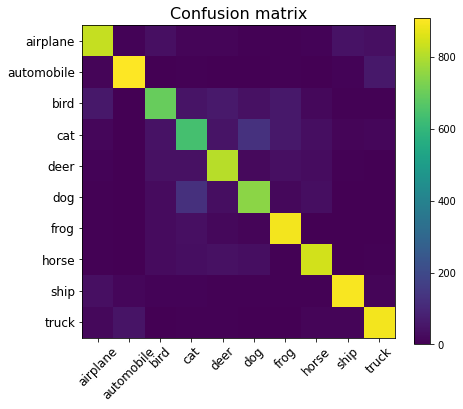

Test accuracy: 0.8159


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:28: MatplotlibDeprecationWarning: Passing unsupported keyword arguments to axis() will raise a TypeError in 3.3.


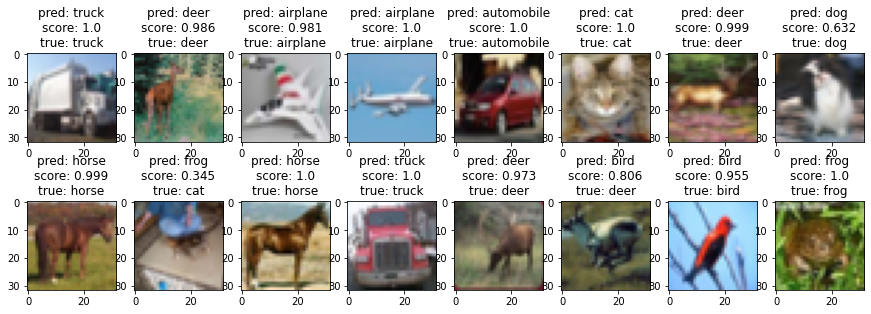

In [ ]:
# load weights from file (can call without model.fit)
model.load_weights("weights.h5")

# make test predictions
y_pred_test = model.predict_proba(x_test2)
y_pred_test_classes = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)

# Show the confusion matrix and accuracy
plt.figure(figsize=(7, 6))
plt.title('Confusion matrix', fontsize=16)
plt.imshow(confusion_matrix(y_test, y_pred_test_classes))
plt.xticks(np.arange(10), cifar10_classes, rotation=45, fontsize=12)
plt.yticks(np.arange(10), cifar10_classes, fontsize=12)
plt.colorbar()
plt.show()
print("Test accuracy:", accuracy_score(y_test, y_pred_test_classes))

# inspect preditions
cols = 8
rows = 2
fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
for i in range(cols):
    for j in range(rows):
        random_index = np.random.randint(0, len(y_test))
        ax = fig.add_subplot(rows, cols, i * rows + j + 1)
        ax.grid(b=False)
        ax.axis(b=False)
        ax.imshow(x_test[random_index, :])
        pred_label = cifar10_classes[y_pred_test_classes[random_index]]
        pred_proba = y_pred_test_max_probas[random_index]
        true_label = cifar10_classes[y_test[random_index, 0]]
        ax.set_title("pred: {}\nscore: {:.3}\ntrue: {}".format(
               pred_label, pred_proba, true_label
        ))
plt.show()

##Experiment
The implementation for the experiment follows the steps below in the code given by the original problem description. Here we used the model of the above classifier c, and then used it to train the fake images generated from the generator, and finally used the fake labels and the fake images to train the classifier c'. The result shows that the acccuracy of the classifier c is 0.7919 and the accuracy of the classifier c' is 0.1. In the training process, the epoch was set to 200 in order to see if there's an improved result compared to epoch = 100. However, the results were not improved much and the potential reson is due to the training for the original classifier still need to be improved in oder to get a better result for the classifier c'. 

Number of epochs: 400
Number of batches: 128


/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:297: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


epoch = 1/400, d_loss=0.038, g_loss=5.543


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:58: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


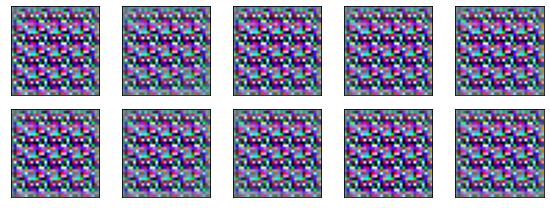

Time for epoch 1 is 31.53618550300598 sec
epoch = 2/400, d_loss=0.024, g_loss=5.988
Time for epoch 2 is 25.58549427986145 sec
epoch = 3/400, d_loss=0.009, g_loss=5.978
Time for epoch 3 is 26.550838708877563 sec
epoch = 4/400, d_loss=0.007, g_loss=7.787
Time for epoch 4 is 26.4626567363739 sec
epoch = 5/400, d_loss=0.003, g_loss=7.706
Time for epoch 5 is 25.203385829925537 sec
epoch = 6/400, d_loss=0.007, g_loss=6.997


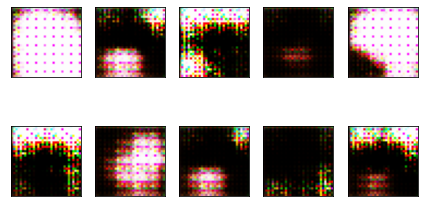

Time for epoch 6 is 25.527513027191162 sec
epoch = 7/400, d_loss=0.007, g_loss=3.434
Time for epoch 7 is 25.087104558944702 sec
epoch = 8/400, d_loss=0.001, g_loss=7.657
Time for epoch 8 is 25.027343034744263 sec
epoch = 9/400, d_loss=0.001, g_loss=8.791
Time for epoch 9 is 25.046437978744507 sec
epoch = 10/400, d_loss=0.000, g_loss=9.454
Time for epoch 10 is 25.375568866729736 sec
epoch = 11/400, d_loss=0.000, g_loss=11.157


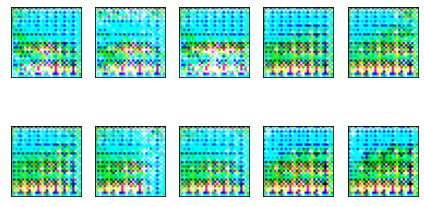

Time for epoch 11 is 25.61931824684143 sec
epoch = 12/400, d_loss=0.000, g_loss=10.564
Time for epoch 12 is 25.309178590774536 sec
epoch = 13/400, d_loss=0.000, g_loss=9.010
Time for epoch 13 is 24.967281579971313 sec
epoch = 14/400, d_loss=0.000, g_loss=10.449
Time for epoch 14 is 25.8219633102417 sec
epoch = 15/400, d_loss=0.000, g_loss=11.174
Time for epoch 15 is 25.866390466690063 sec
epoch = 16/400, d_loss=0.000, g_loss=11.302


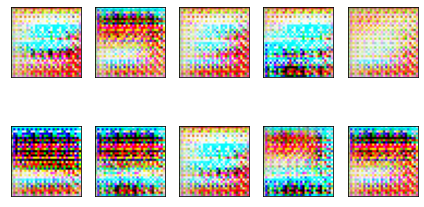

Time for epoch 16 is 25.51274538040161 sec
epoch = 17/400, d_loss=0.000, g_loss=12.593
Time for epoch 17 is 25.41872262954712 sec
epoch = 18/400, d_loss=0.000, g_loss=7.434
Time for epoch 18 is 25.09443211555481 sec
epoch = 19/400, d_loss=0.001, g_loss=7.943
Time for epoch 19 is 25.389836072921753 sec
epoch = 20/400, d_loss=0.002, g_loss=4.969
Time for epoch 20 is 25.089624643325806 sec
epoch = 21/400, d_loss=0.003, g_loss=7.052


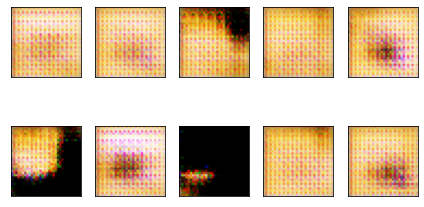

Time for epoch 21 is 25.630976676940918 sec
epoch = 22/400, d_loss=0.001, g_loss=7.133
Time for epoch 22 is 25.341652393341064 sec
epoch = 23/400, d_loss=0.001, g_loss=8.534
Time for epoch 23 is 25.317746877670288 sec
epoch = 24/400, d_loss=0.001, g_loss=7.696
Time for epoch 24 is 25.893636226654053 sec
epoch = 25/400, d_loss=0.000, g_loss=9.508
Time for epoch 25 is 25.76579475402832 sec
epoch = 26/400, d_loss=0.000, g_loss=8.905


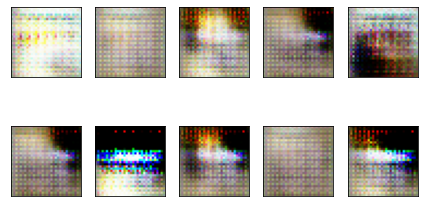

Time for epoch 26 is 25.971694231033325 sec
epoch = 27/400, d_loss=0.000, g_loss=9.976
Time for epoch 27 is 25.587212800979614 sec
epoch = 28/400, d_loss=0.000, g_loss=11.234
Time for epoch 28 is 25.681037425994873 sec
epoch = 29/400, d_loss=0.000, g_loss=9.528
Time for epoch 29 is 25.369258880615234 sec
epoch = 30/400, d_loss=0.000, g_loss=11.339
Time for epoch 30 is 25.655630826950073 sec
epoch = 31/400, d_loss=0.000, g_loss=11.163


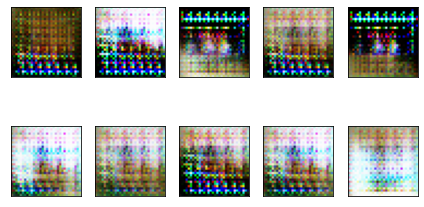

Time for epoch 31 is 25.604199171066284 sec
epoch = 32/400, d_loss=0.000, g_loss=10.322
Time for epoch 32 is 25.530133962631226 sec
epoch = 33/400, d_loss=0.000, g_loss=11.629
Time for epoch 33 is 25.005218744277954 sec
epoch = 34/400, d_loss=0.000, g_loss=8.720
Time for epoch 34 is 25.229202032089233 sec
epoch = 35/400, d_loss=0.002, g_loss=6.737
Time for epoch 35 is 25.68842124938965 sec
epoch = 36/400, d_loss=0.001, g_loss=6.434


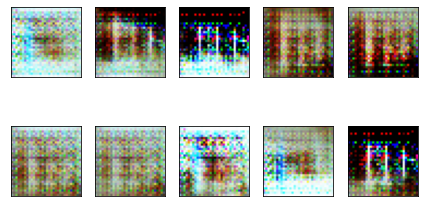

Time for epoch 36 is 25.981605291366577 sec
epoch = 37/400, d_loss=0.002, g_loss=9.136
Time for epoch 37 is 25.39790630340576 sec
epoch = 38/400, d_loss=0.000, g_loss=6.604
Time for epoch 38 is 25.9165780544281 sec
epoch = 39/400, d_loss=0.001, g_loss=7.915
Time for epoch 39 is 25.69116187095642 sec
epoch = 40/400, d_loss=0.000, g_loss=9.925
Time for epoch 40 is 25.56125259399414 sec
epoch = 41/400, d_loss=0.000, g_loss=9.153


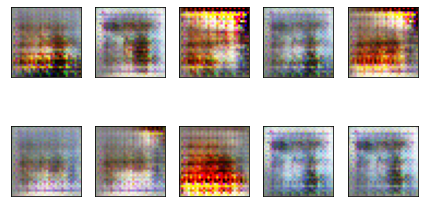

Time for epoch 41 is 25.8638174533844 sec
epoch = 42/400, d_loss=0.000, g_loss=10.413
Time for epoch 42 is 24.93237853050232 sec
epoch = 43/400, d_loss=0.000, g_loss=8.147
Time for epoch 43 is 25.197640895843506 sec
epoch = 44/400, d_loss=0.001, g_loss=10.131
Time for epoch 44 is 25.1142258644104 sec
epoch = 45/400, d_loss=0.000, g_loss=11.685
Time for epoch 45 is 25.1054368019104 sec
epoch = 46/400, d_loss=0.001, g_loss=4.780


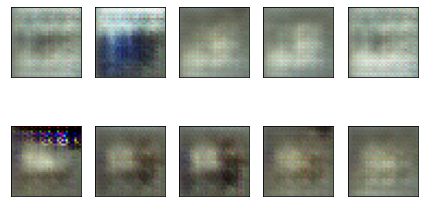

Time for epoch 46 is 25.356979370117188 sec
epoch = 47/400, d_loss=0.001, g_loss=8.828
Time for epoch 47 is 25.769864797592163 sec
epoch = 48/400, d_loss=0.002, g_loss=7.653
Time for epoch 48 is 25.505101680755615 sec
epoch = 49/400, d_loss=0.002, g_loss=8.968
Time for epoch 49 is 25.061616897583008 sec
epoch = 50/400, d_loss=0.000, g_loss=11.092
Time for epoch 50 is 26.011977434158325 sec
epoch = 51/400, d_loss=0.003, g_loss=5.731


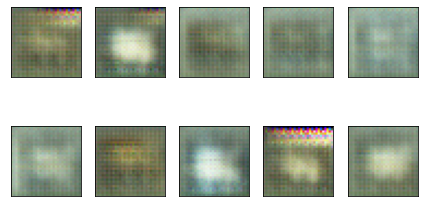

Time for epoch 51 is 25.987634658813477 sec
epoch = 52/400, d_loss=0.001, g_loss=7.838
Time for epoch 52 is 26.34670090675354 sec
epoch = 53/400, d_loss=0.001, g_loss=8.242
Time for epoch 53 is 25.69370198249817 sec
epoch = 54/400, d_loss=0.002, g_loss=8.856
Time for epoch 54 is 25.559358596801758 sec
epoch = 55/400, d_loss=0.005, g_loss=7.854
Time for epoch 55 is 24.969240427017212 sec
epoch = 56/400, d_loss=0.020, g_loss=5.800


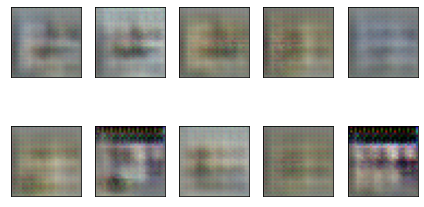

Time for epoch 56 is 26.779556274414062 sec
epoch = 57/400, d_loss=0.019, g_loss=9.620
Time for epoch 57 is 25.4710476398468 sec
epoch = 58/400, d_loss=0.009, g_loss=5.254
Time for epoch 58 is 25.426066637039185 sec
epoch = 59/400, d_loss=0.004, g_loss=5.542
Time for epoch 59 is 25.296827793121338 sec
epoch = 60/400, d_loss=0.025, g_loss=5.450
Time for epoch 60 is 25.640666246414185 sec
epoch = 61/400, d_loss=0.002, g_loss=3.503


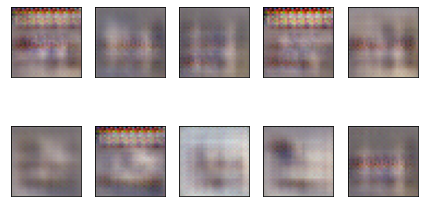

Time for epoch 61 is 25.721230030059814 sec
epoch = 62/400, d_loss=0.027, g_loss=5.277
Time for epoch 62 is 25.402160167694092 sec
epoch = 63/400, d_loss=0.006, g_loss=7.783
Time for epoch 63 is 25.407266855239868 sec
epoch = 64/400, d_loss=0.012, g_loss=4.334
Time for epoch 64 is 26.060883045196533 sec
epoch = 65/400, d_loss=0.001, g_loss=9.912
Time for epoch 65 is 24.953426361083984 sec
epoch = 66/400, d_loss=0.012, g_loss=8.976


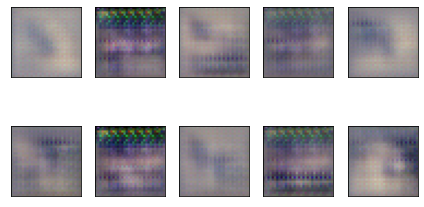

Time for epoch 66 is 25.517064332962036 sec
epoch = 67/400, d_loss=0.001, g_loss=9.318
Time for epoch 67 is 25.544485569000244 sec
epoch = 68/400, d_loss=0.000, g_loss=9.400
Time for epoch 68 is 25.33588671684265 sec
epoch = 69/400, d_loss=0.027, g_loss=4.706
Time for epoch 69 is 25.598859786987305 sec
epoch = 70/400, d_loss=0.024, g_loss=4.215
Time for epoch 70 is 25.14783477783203 sec
epoch = 71/400, d_loss=0.025, g_loss=6.915


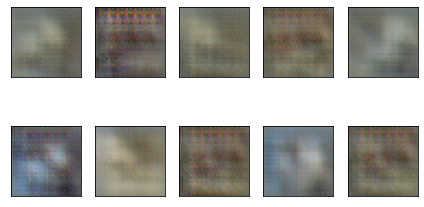

Time for epoch 71 is 25.81483745574951 sec
epoch = 72/400, d_loss=0.029, g_loss=4.588
Time for epoch 72 is 25.745736122131348 sec
epoch = 73/400, d_loss=0.002, g_loss=7.096
Time for epoch 73 is 25.245840311050415 sec
epoch = 74/400, d_loss=0.019, g_loss=7.020
Time for epoch 74 is 25.329152822494507 sec
epoch = 75/400, d_loss=0.003, g_loss=5.426
Time for epoch 75 is 25.509504795074463 sec
epoch = 76/400, d_loss=0.025, g_loss=5.625


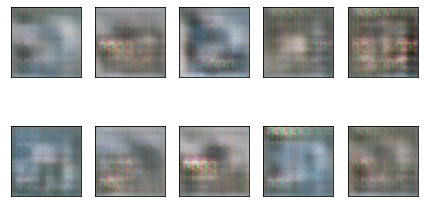

Time for epoch 76 is 25.75959825515747 sec
epoch = 77/400, d_loss=0.000, g_loss=11.403
Time for epoch 77 is 25.522358894348145 sec
epoch = 78/400, d_loss=0.016, g_loss=7.549
Time for epoch 78 is 25.910957098007202 sec
epoch = 79/400, d_loss=0.007, g_loss=6.269
Time for epoch 79 is 25.4993155002594 sec
epoch = 80/400, d_loss=0.001, g_loss=7.251
Time for epoch 80 is 25.221104383468628 sec
epoch = 81/400, d_loss=0.009, g_loss=7.706


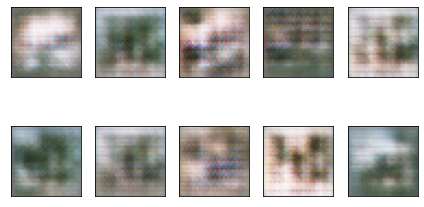

Time for epoch 81 is 26.3299777507782 sec
epoch = 82/400, d_loss=0.020, g_loss=7.167
Time for epoch 82 is 25.833949327468872 sec
epoch = 83/400, d_loss=0.027, g_loss=6.472
Time for epoch 83 is 24.90627956390381 sec
epoch = 84/400, d_loss=0.015, g_loss=5.716
Time for epoch 84 is 25.94501233100891 sec
epoch = 85/400, d_loss=0.006, g_loss=7.055
Time for epoch 85 is 25.68134641647339 sec
epoch = 86/400, d_loss=0.004, g_loss=6.747


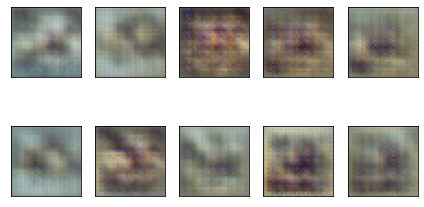

Time for epoch 86 is 25.924944639205933 sec
epoch = 87/400, d_loss=0.005, g_loss=10.108
Time for epoch 87 is 25.461541652679443 sec
epoch = 88/400, d_loss=0.002, g_loss=8.393
Time for epoch 88 is 25.777892112731934 sec
epoch = 89/400, d_loss=0.016, g_loss=5.864
Time for epoch 89 is 25.294026613235474 sec
epoch = 90/400, d_loss=0.004, g_loss=8.209
Time for epoch 90 is 24.8818678855896 sec
epoch = 91/400, d_loss=0.002, g_loss=6.793


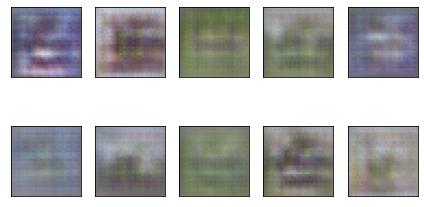

Time for epoch 91 is 25.936754941940308 sec
epoch = 92/400, d_loss=0.006, g_loss=5.503
Time for epoch 92 is 25.312376737594604 sec
epoch = 93/400, d_loss=0.017, g_loss=6.054
Time for epoch 93 is 25.049203157424927 sec
epoch = 94/400, d_loss=0.001, g_loss=8.133
Time for epoch 94 is 25.246650218963623 sec
epoch = 95/400, d_loss=0.008, g_loss=8.047
Time for epoch 95 is 25.086300373077393 sec
epoch = 96/400, d_loss=0.001, g_loss=10.022


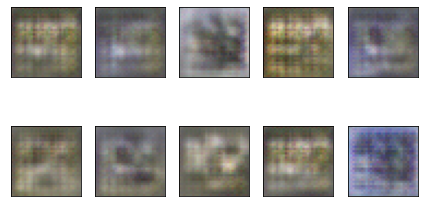

Time for epoch 96 is 25.90514826774597 sec
epoch = 97/400, d_loss=0.002, g_loss=7.189
Time for epoch 97 is 25.191012620925903 sec
epoch = 98/400, d_loss=0.002, g_loss=7.556
Time for epoch 98 is 25.015730619430542 sec
epoch = 99/400, d_loss=0.010, g_loss=4.344
Time for epoch 99 is 25.25993013381958 sec
epoch = 100/400, d_loss=0.002, g_loss=8.475
Time for epoch 100 is 25.584424257278442 sec
epoch = 101/400, d_loss=0.011, g_loss=7.408


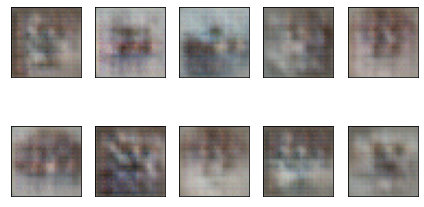

Time for epoch 101 is 25.78815507888794 sec
epoch = 102/400, d_loss=0.002, g_loss=7.126
Time for epoch 102 is 24.9408860206604 sec
epoch = 103/400, d_loss=0.028, g_loss=6.801
Time for epoch 103 is 25.48507833480835 sec
epoch = 104/400, d_loss=0.002, g_loss=9.436
Time for epoch 104 is 25.431073904037476 sec
epoch = 105/400, d_loss=0.004, g_loss=7.729
Time for epoch 105 is 25.377663373947144 sec
epoch = 106/400, d_loss=0.046, g_loss=7.936


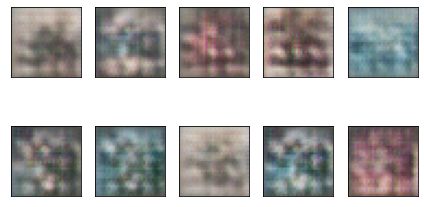

Time for epoch 106 is 25.541902542114258 sec
epoch = 107/400, d_loss=0.001, g_loss=6.253
Time for epoch 107 is 25.186690092086792 sec
epoch = 108/400, d_loss=0.010, g_loss=7.942
Time for epoch 108 is 25.250016689300537 sec
epoch = 109/400, d_loss=0.008, g_loss=6.681
Time for epoch 109 is 25.40078854560852 sec
epoch = 110/400, d_loss=0.002, g_loss=9.445
Time for epoch 110 is 25.599135398864746 sec
epoch = 111/400, d_loss=0.001, g_loss=8.470


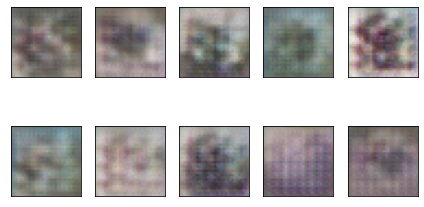

Time for epoch 111 is 25.702465057373047 sec
epoch = 112/400, d_loss=0.003, g_loss=5.962
Time for epoch 112 is 25.085897207260132 sec
epoch = 113/400, d_loss=0.015, g_loss=8.118
Time for epoch 113 is 26.27331042289734 sec
epoch = 114/400, d_loss=0.011, g_loss=6.388
Time for epoch 114 is 25.38498568534851 sec
epoch = 115/400, d_loss=10.093, g_loss=18.446
Time for epoch 115 is 25.17443871498108 sec
epoch = 116/400, d_loss=0.052, g_loss=4.472


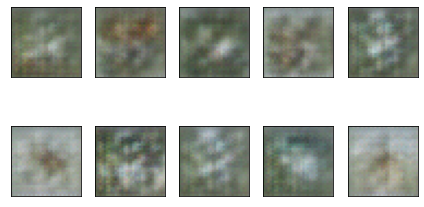

Time for epoch 116 is 25.576677560806274 sec
epoch = 117/400, d_loss=0.005, g_loss=7.628
Time for epoch 117 is 25.651264190673828 sec
epoch = 118/400, d_loss=0.002, g_loss=7.005
Time for epoch 118 is 25.409355401992798 sec
epoch = 119/400, d_loss=0.003, g_loss=8.685
Time for epoch 119 is 25.367793798446655 sec
epoch = 120/400, d_loss=0.001, g_loss=7.737
Time for epoch 120 is 25.65458083152771 sec
epoch = 121/400, d_loss=0.005, g_loss=8.719


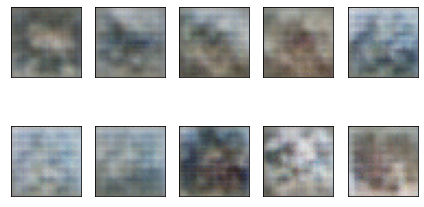

Time for epoch 121 is 25.886430263519287 sec
epoch = 122/400, d_loss=0.007, g_loss=5.612
Time for epoch 122 is 25.578338384628296 sec
epoch = 123/400, d_loss=0.002, g_loss=6.983
Time for epoch 123 is 25.395317792892456 sec
epoch = 124/400, d_loss=0.003, g_loss=6.008
Time for epoch 124 is 25.71122407913208 sec
epoch = 125/400, d_loss=0.015, g_loss=6.320
Time for epoch 125 is 25.751288175582886 sec
epoch = 126/400, d_loss=0.002, g_loss=7.906


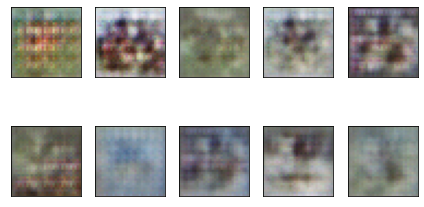

Time for epoch 126 is 26.22593331336975 sec
epoch = 127/400, d_loss=0.036, g_loss=5.768
Time for epoch 127 is 24.94809889793396 sec
epoch = 128/400, d_loss=0.004, g_loss=10.575
Time for epoch 128 is 25.733705520629883 sec
epoch = 129/400, d_loss=0.009, g_loss=6.130
Time for epoch 129 is 25.583513498306274 sec
epoch = 130/400, d_loss=0.002, g_loss=7.185
Time for epoch 130 is 25.397294998168945 sec
epoch = 131/400, d_loss=0.048, g_loss=6.920


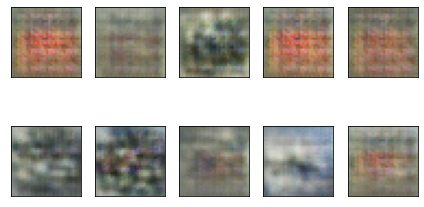

Time for epoch 131 is 25.454601526260376 sec
epoch = 132/400, d_loss=0.025, g_loss=8.422
Time for epoch 132 is 25.79799461364746 sec
epoch = 133/400, d_loss=0.001, g_loss=9.556
Time for epoch 133 is 25.424242973327637 sec
epoch = 134/400, d_loss=0.010, g_loss=5.560
Time for epoch 134 is 25.050731658935547 sec
epoch = 135/400, d_loss=0.006, g_loss=5.862
Time for epoch 135 is 25.65071749687195 sec
epoch = 136/400, d_loss=0.001, g_loss=7.904


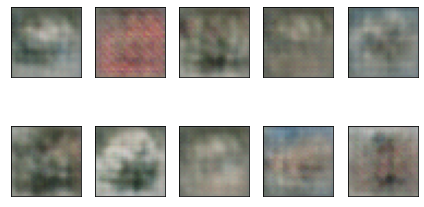

Time for epoch 136 is 26.336727619171143 sec
epoch = 137/400, d_loss=0.001, g_loss=7.865
Time for epoch 137 is 25.68136429786682 sec
epoch = 138/400, d_loss=0.000, g_loss=21.964
Time for epoch 138 is 25.321342945098877 sec
epoch = 139/400, d_loss=0.026, g_loss=4.787
Time for epoch 139 is 25.506213665008545 sec
epoch = 140/400, d_loss=0.002, g_loss=7.342
Time for epoch 140 is 25.4924418926239 sec
epoch = 141/400, d_loss=0.001, g_loss=8.152


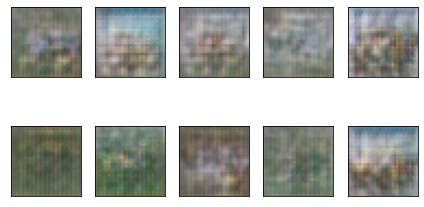

Time for epoch 141 is 25.775522708892822 sec
epoch = 142/400, d_loss=0.001, g_loss=7.563
Time for epoch 142 is 25.726585149765015 sec
epoch = 143/400, d_loss=0.001, g_loss=4.530
Time for epoch 143 is 25.35231351852417 sec
epoch = 144/400, d_loss=0.001, g_loss=5.927
Time for epoch 144 is 25.29490351676941 sec
epoch = 145/400, d_loss=0.003, g_loss=6.429
Time for epoch 145 is 25.972941398620605 sec
epoch = 146/400, d_loss=0.009, g_loss=7.016


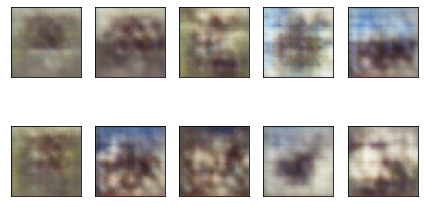

Time for epoch 146 is 25.214582920074463 sec
epoch = 147/400, d_loss=0.002, g_loss=7.865
Time for epoch 147 is 25.077957153320312 sec
epoch = 148/400, d_loss=0.011, g_loss=7.330
Time for epoch 148 is 25.487975358963013 sec
epoch = 149/400, d_loss=0.016, g_loss=8.457
Time for epoch 149 is 25.74598002433777 sec
epoch = 150/400, d_loss=0.001, g_loss=9.054
Time for epoch 150 is 25.725780487060547 sec
epoch = 151/400, d_loss=0.004, g_loss=5.395


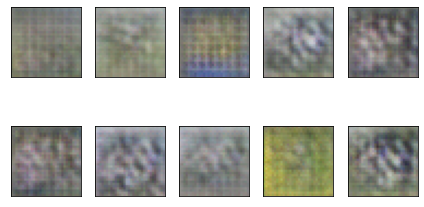

Time for epoch 151 is 25.901667833328247 sec
epoch = 152/400, d_loss=0.003, g_loss=10.586
Time for epoch 152 is 25.805126428604126 sec
epoch = 153/400, d_loss=0.019, g_loss=5.742
Time for epoch 153 is 25.142534255981445 sec
epoch = 154/400, d_loss=0.024, g_loss=4.961
Time for epoch 154 is 25.648072242736816 sec
epoch = 155/400, d_loss=0.001, g_loss=9.938
Time for epoch 155 is 25.894083976745605 sec
epoch = 156/400, d_loss=0.007, g_loss=9.660


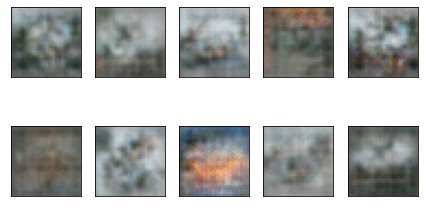

Time for epoch 156 is 25.91199254989624 sec
epoch = 157/400, d_loss=0.001, g_loss=8.875
Time for epoch 157 is 25.504445791244507 sec
epoch = 158/400, d_loss=0.165, g_loss=4.149
Time for epoch 158 is 24.954543352127075 sec
epoch = 159/400, d_loss=0.002, g_loss=6.336
Time for epoch 159 is 25.48150396347046 sec
epoch = 160/400, d_loss=0.001, g_loss=7.253
Time for epoch 160 is 25.417149305343628 sec
epoch = 161/400, d_loss=0.000, g_loss=8.676


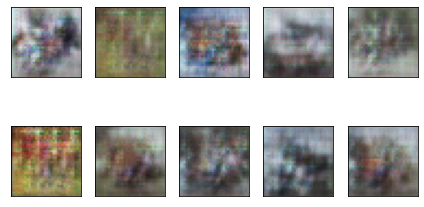

Time for epoch 161 is 25.788121700286865 sec
epoch = 162/400, d_loss=0.001, g_loss=6.858
Time for epoch 162 is 24.867140769958496 sec
epoch = 163/400, d_loss=0.010, g_loss=5.086
Time for epoch 163 is 25.050475597381592 sec
epoch = 164/400, d_loss=0.120, g_loss=9.268
Time for epoch 164 is 25.143378973007202 sec
epoch = 165/400, d_loss=0.001, g_loss=7.503
Time for epoch 165 is 25.462984323501587 sec
epoch = 166/400, d_loss=0.012, g_loss=6.728


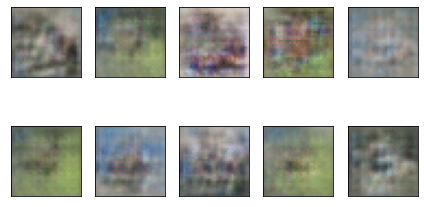

Time for epoch 166 is 25.69710087776184 sec
epoch = 167/400, d_loss=0.016, g_loss=6.617
Time for epoch 167 is 25.327857494354248 sec
epoch = 168/400, d_loss=0.023, g_loss=5.425
Time for epoch 168 is 25.07933020591736 sec
epoch = 169/400, d_loss=0.025, g_loss=6.761
Time for epoch 169 is 25.03989028930664 sec
epoch = 170/400, d_loss=0.020, g_loss=5.117
Time for epoch 170 is 25.68593430519104 sec
epoch = 171/400, d_loss=0.013, g_loss=6.043


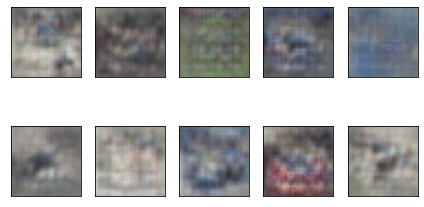

Time for epoch 171 is 25.21545720100403 sec
epoch = 172/400, d_loss=0.009, g_loss=7.015
Time for epoch 172 is 24.74054265022278 sec
epoch = 173/400, d_loss=0.014, g_loss=8.142
Time for epoch 173 is 25.620089054107666 sec
epoch = 174/400, d_loss=0.009, g_loss=6.428
Time for epoch 174 is 25.907015562057495 sec
epoch = 175/400, d_loss=0.008, g_loss=7.701
Time for epoch 175 is 25.71528434753418 sec
epoch = 176/400, d_loss=0.000, g_loss=8.275


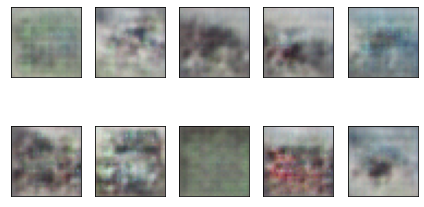

Time for epoch 176 is 25.767843008041382 sec
epoch = 177/400, d_loss=0.004, g_loss=8.206
Time for epoch 177 is 24.88805341720581 sec
epoch = 178/400, d_loss=0.002, g_loss=6.639
Time for epoch 178 is 25.647920846939087 sec
epoch = 179/400, d_loss=0.005, g_loss=4.917
Time for epoch 179 is 25.32031798362732 sec
epoch = 180/400, d_loss=0.030, g_loss=8.063
Time for epoch 180 is 25.6634578704834 sec
epoch = 181/400, d_loss=0.015, g_loss=5.073


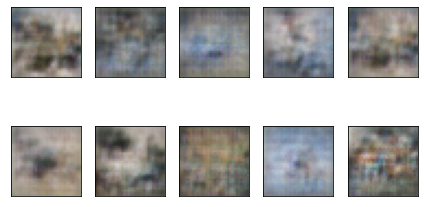

Time for epoch 181 is 25.61746883392334 sec
epoch = 182/400, d_loss=0.000, g_loss=7.186
Time for epoch 182 is 24.99662446975708 sec
epoch = 183/400, d_loss=0.007, g_loss=9.568
Time for epoch 183 is 25.546485424041748 sec
epoch = 184/400, d_loss=0.010, g_loss=8.743
Time for epoch 184 is 25.69521403312683 sec
epoch = 185/400, d_loss=0.001, g_loss=6.862
Time for epoch 185 is 25.32073998451233 sec
epoch = 186/400, d_loss=0.041, g_loss=6.359


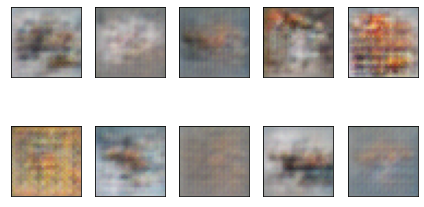

Time for epoch 186 is 25.704861879348755 sec
epoch = 187/400, d_loss=0.001, g_loss=5.668
Time for epoch 187 is 25.268419981002808 sec
epoch = 188/400, d_loss=0.049, g_loss=3.314
Time for epoch 188 is 25.436726093292236 sec
epoch = 189/400, d_loss=0.002, g_loss=8.641
Time for epoch 189 is 25.946282386779785 sec
epoch = 190/400, d_loss=0.033, g_loss=7.513
Time for epoch 190 is 25.199294567108154 sec
epoch = 191/400, d_loss=0.034, g_loss=8.202


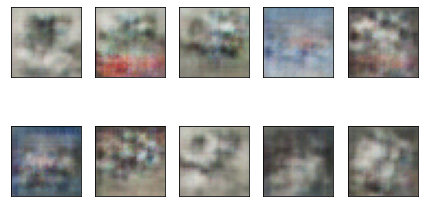

Time for epoch 191 is 26.06220316886902 sec
epoch = 192/400, d_loss=0.004, g_loss=7.586
Time for epoch 192 is 25.656495094299316 sec
epoch = 193/400, d_loss=0.000, g_loss=7.853
Time for epoch 193 is 25.556318283081055 sec
epoch = 194/400, d_loss=0.009, g_loss=7.015
Time for epoch 194 is 24.90088415145874 sec
epoch = 195/400, d_loss=0.020, g_loss=8.480
Time for epoch 195 is 25.36039662361145 sec
epoch = 196/400, d_loss=0.018, g_loss=4.985


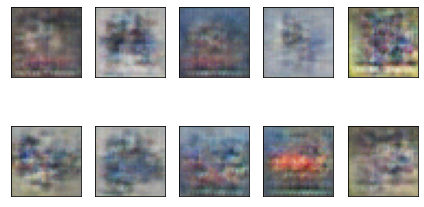

Time for epoch 196 is 25.204192638397217 sec
epoch = 197/400, d_loss=0.004, g_loss=7.701
Time for epoch 197 is 25.10059380531311 sec
epoch = 198/400, d_loss=0.024, g_loss=8.136
Time for epoch 198 is 25.815062999725342 sec
epoch = 199/400, d_loss=0.002, g_loss=7.155
Time for epoch 199 is 24.94405198097229 sec
epoch = 200/400, d_loss=0.007, g_loss=6.126
Time for epoch 200 is 25.20990514755249 sec
epoch = 201/400, d_loss=0.115, g_loss=3.545


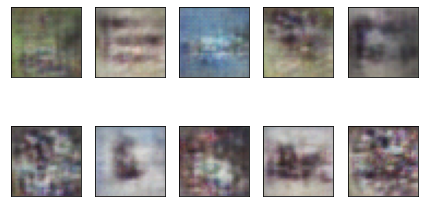

Time for epoch 201 is 26.02061414718628 sec
epoch = 202/400, d_loss=0.017, g_loss=7.093
Time for epoch 202 is 25.234155416488647 sec
epoch = 203/400, d_loss=0.000, g_loss=15.403
Time for epoch 203 is 25.415794849395752 sec
epoch = 204/400, d_loss=0.004, g_loss=5.650
Time for epoch 204 is 26.16212511062622 sec
epoch = 205/400, d_loss=0.001, g_loss=8.344
Time for epoch 205 is 24.880194425582886 sec
epoch = 206/400, d_loss=0.000, g_loss=10.265


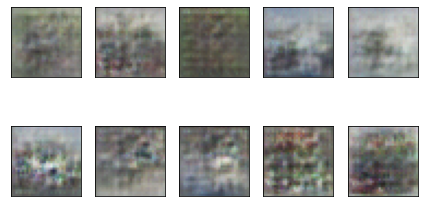

Time for epoch 206 is 25.54769778251648 sec
epoch = 207/400, d_loss=0.004, g_loss=8.586
Time for epoch 207 is 24.95143723487854 sec
epoch = 208/400, d_loss=0.006, g_loss=7.250
Time for epoch 208 is 25.400425910949707 sec
epoch = 209/400, d_loss=0.032, g_loss=3.770
Time for epoch 209 is 25.439728498458862 sec
epoch = 210/400, d_loss=0.005, g_loss=7.041
Time for epoch 210 is 25.531793355941772 sec
epoch = 211/400, d_loss=0.027, g_loss=6.739


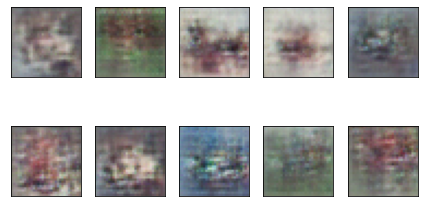

Time for epoch 211 is 25.580153465270996 sec
epoch = 212/400, d_loss=0.005, g_loss=5.444
Time for epoch 212 is 25.32580876350403 sec
epoch = 213/400, d_loss=0.026, g_loss=7.370
Time for epoch 213 is 24.90348505973816 sec
epoch = 214/400, d_loss=0.003, g_loss=7.629
Time for epoch 214 is 25.281774759292603 sec
epoch = 215/400, d_loss=0.009, g_loss=6.605
Time for epoch 215 is 24.953483819961548 sec
epoch = 216/400, d_loss=0.013, g_loss=8.092


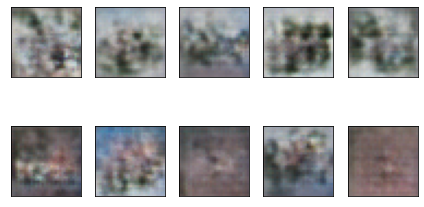

Time for epoch 216 is 25.726701021194458 sec
epoch = 217/400, d_loss=0.005, g_loss=5.594
Time for epoch 217 is 25.296624422073364 sec
epoch = 218/400, d_loss=0.001, g_loss=10.393
Time for epoch 218 is 25.21662712097168 sec
epoch = 219/400, d_loss=0.004, g_loss=6.993
Time for epoch 219 is 24.91737461090088 sec
epoch = 220/400, d_loss=0.001, g_loss=9.198
Time for epoch 220 is 25.440470218658447 sec
epoch = 221/400, d_loss=0.002, g_loss=8.218


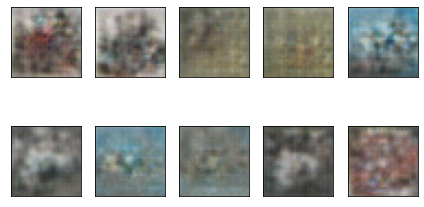

Time for epoch 221 is 25.25933575630188 sec
epoch = 222/400, d_loss=0.004, g_loss=6.010
Time for epoch 222 is 25.26546859741211 sec
epoch = 223/400, d_loss=0.016, g_loss=15.273
Time for epoch 223 is 24.957090854644775 sec
epoch = 224/400, d_loss=0.001, g_loss=11.091
Time for epoch 224 is 25.21632957458496 sec
epoch = 225/400, d_loss=0.021, g_loss=4.277
Time for epoch 225 is 25.06286358833313 sec
epoch = 226/400, d_loss=0.005, g_loss=9.651


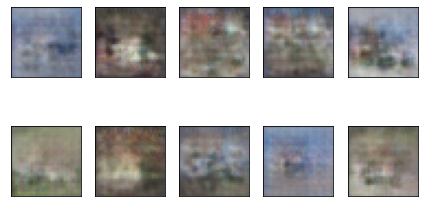

Time for epoch 226 is 25.871703624725342 sec
epoch = 227/400, d_loss=0.004, g_loss=7.338
Time for epoch 227 is 25.65460991859436 sec
epoch = 228/400, d_loss=0.011, g_loss=5.644
Time for epoch 228 is 25.06838822364807 sec
epoch = 229/400, d_loss=0.005, g_loss=6.070
Time for epoch 229 is 25.066600799560547 sec
epoch = 230/400, d_loss=0.016, g_loss=8.823
Time for epoch 230 is 25.242604732513428 sec
epoch = 231/400, d_loss=0.011, g_loss=4.669


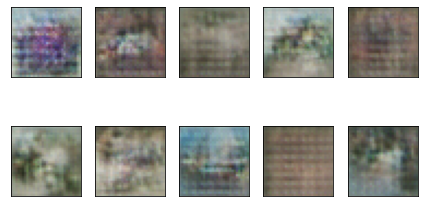

Time for epoch 231 is 24.98662543296814 sec
epoch = 232/400, d_loss=0.004, g_loss=8.805
Time for epoch 232 is 24.942718505859375 sec
epoch = 233/400, d_loss=0.003, g_loss=6.447
Time for epoch 233 is 25.16604471206665 sec
epoch = 234/400, d_loss=0.002, g_loss=9.212
Time for epoch 234 is 24.91655731201172 sec
epoch = 235/400, d_loss=0.041, g_loss=5.140
Time for epoch 235 is 25.443485260009766 sec
epoch = 236/400, d_loss=0.004, g_loss=10.526


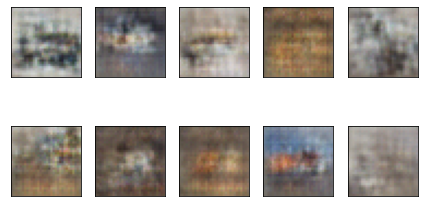

Time for epoch 236 is 25.74065351486206 sec
epoch = 237/400, d_loss=0.014, g_loss=4.413
Time for epoch 237 is 25.40985918045044 sec
epoch = 238/400, d_loss=0.003, g_loss=7.602
Time for epoch 238 is 25.533201456069946 sec
epoch = 239/400, d_loss=0.011, g_loss=3.219
Time for epoch 239 is 25.339083433151245 sec
epoch = 240/400, d_loss=0.040, g_loss=6.496
Time for epoch 240 is 25.641093015670776 sec
epoch = 241/400, d_loss=0.002, g_loss=6.317


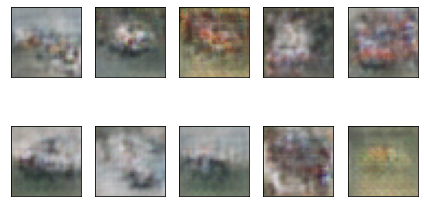

Time for epoch 241 is 25.38052535057068 sec
epoch = 242/400, d_loss=0.016, g_loss=6.445
Time for epoch 242 is 25.444347381591797 sec
epoch = 243/400, d_loss=0.005, g_loss=6.995
Time for epoch 243 is 24.898733139038086 sec
epoch = 244/400, d_loss=0.004, g_loss=5.345
Time for epoch 244 is 24.99104952812195 sec
epoch = 245/400, d_loss=0.001, g_loss=9.555
Time for epoch 245 is 25.03884720802307 sec
epoch = 246/400, d_loss=0.004, g_loss=5.878


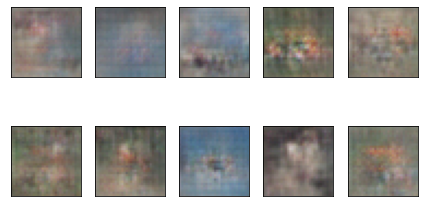

Time for epoch 246 is 26.059428215026855 sec
epoch = 247/400, d_loss=0.025, g_loss=6.127
Time for epoch 247 is 25.462639570236206 sec
epoch = 248/400, d_loss=0.009, g_loss=7.371
Time for epoch 248 is 24.942712783813477 sec
epoch = 249/400, d_loss=0.002, g_loss=7.632
Time for epoch 249 is 25.416419982910156 sec
epoch = 250/400, d_loss=0.005, g_loss=9.368
Time for epoch 250 is 25.162195205688477 sec
epoch = 251/400, d_loss=0.019, g_loss=4.089


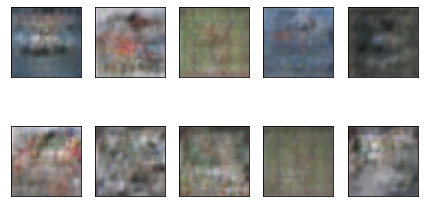

Time for epoch 251 is 25.189389944076538 sec
epoch = 252/400, d_loss=0.034, g_loss=5.717
Time for epoch 252 is 25.80944061279297 sec
epoch = 253/400, d_loss=0.001, g_loss=9.942
Time for epoch 253 is 25.3867347240448 sec
epoch = 254/400, d_loss=0.011, g_loss=5.011
Time for epoch 254 is 25.555163145065308 sec
epoch = 255/400, d_loss=0.003, g_loss=8.347
Time for epoch 255 is 25.63729977607727 sec
epoch = 256/400, d_loss=0.002, g_loss=8.827


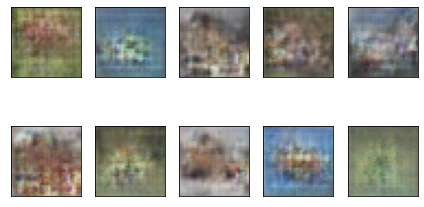

Time for epoch 256 is 25.72309899330139 sec
epoch = 257/400, d_loss=0.014, g_loss=8.323
Time for epoch 257 is 25.243194341659546 sec
epoch = 258/400, d_loss=0.003, g_loss=6.533
Time for epoch 258 is 25.070422887802124 sec
epoch = 259/400, d_loss=0.001, g_loss=8.493
Time for epoch 259 is 25.805095195770264 sec
epoch = 260/400, d_loss=0.009, g_loss=7.525
Time for epoch 260 is 24.821047067642212 sec
epoch = 261/400, d_loss=0.029, g_loss=7.974


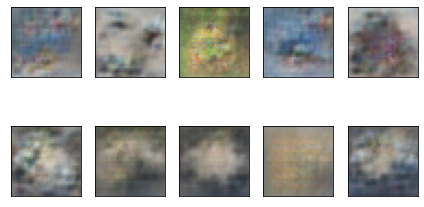

Time for epoch 261 is 25.382178783416748 sec
epoch = 262/400, d_loss=0.133, g_loss=8.529
Time for epoch 262 is 25.288996696472168 sec
epoch = 263/400, d_loss=0.004, g_loss=8.948
Time for epoch 263 is 25.039268255233765 sec
epoch = 264/400, d_loss=0.003, g_loss=8.010
Time for epoch 264 is 25.848425149917603 sec
epoch = 265/400, d_loss=0.000, g_loss=11.182
Time for epoch 265 is 25.01443338394165 sec
epoch = 266/400, d_loss=0.005, g_loss=7.939


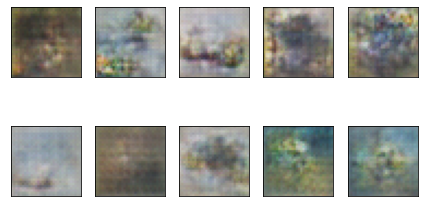

Time for epoch 266 is 25.419813871383667 sec
epoch = 267/400, d_loss=0.002, g_loss=9.758
Time for epoch 267 is 24.95317268371582 sec
epoch = 268/400, d_loss=0.012, g_loss=9.070
Time for epoch 268 is 25.01797580718994 sec
epoch = 269/400, d_loss=0.007, g_loss=6.699
Time for epoch 269 is 24.919294595718384 sec
epoch = 270/400, d_loss=0.003, g_loss=8.398
Time for epoch 270 is 25.0935800075531 sec
epoch = 271/400, d_loss=0.027, g_loss=9.496


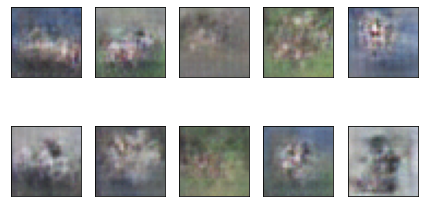

Time for epoch 271 is 26.113502979278564 sec
epoch = 272/400, d_loss=0.002, g_loss=8.494
Time for epoch 272 is 25.31430959701538 sec
epoch = 273/400, d_loss=0.056, g_loss=6.023
Time for epoch 273 is 25.351768016815186 sec
epoch = 274/400, d_loss=0.001, g_loss=3.845
Time for epoch 274 is 24.951947927474976 sec
epoch = 275/400, d_loss=0.001, g_loss=6.110
Time for epoch 275 is 24.97097396850586 sec
epoch = 276/400, d_loss=0.041, g_loss=5.141


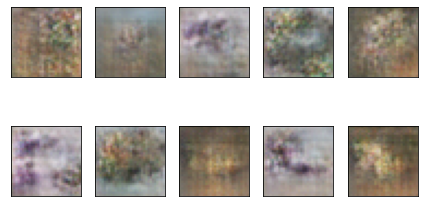

Time for epoch 276 is 25.478215217590332 sec
epoch = 277/400, d_loss=0.000, g_loss=10.063
Time for epoch 277 is 25.04478907585144 sec
epoch = 278/400, d_loss=0.003, g_loss=8.689
Time for epoch 278 is 25.02650761604309 sec
epoch = 279/400, d_loss=0.012, g_loss=4.025
Time for epoch 279 is 25.20487380027771 sec
epoch = 280/400, d_loss=0.001, g_loss=9.416
Time for epoch 280 is 25.13478112220764 sec
epoch = 281/400, d_loss=0.051, g_loss=4.792


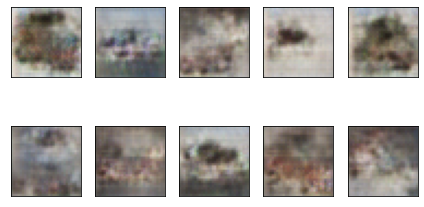

Time for epoch 281 is 25.494867086410522 sec
epoch = 282/400, d_loss=0.030, g_loss=5.884
Time for epoch 282 is 24.86948585510254 sec
epoch = 283/400, d_loss=0.004, g_loss=3.204
Time for epoch 283 is 25.380510091781616 sec
epoch = 284/400, d_loss=0.004, g_loss=6.327
Time for epoch 284 is 26.04387617111206 sec
epoch = 285/400, d_loss=0.010, g_loss=5.399
Time for epoch 285 is 25.208983898162842 sec
epoch = 286/400, d_loss=0.006, g_loss=7.128


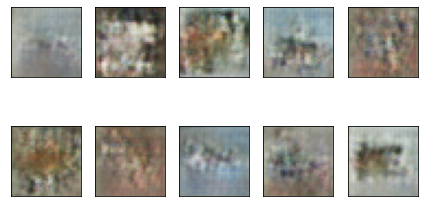

Time for epoch 286 is 25.774149417877197 sec
epoch = 287/400, d_loss=0.003, g_loss=5.767
Time for epoch 287 is 25.495128870010376 sec
epoch = 288/400, d_loss=0.003, g_loss=4.533
Time for epoch 288 is 24.996268272399902 sec
epoch = 289/400, d_loss=0.007, g_loss=7.139
Time for epoch 289 is 25.10627508163452 sec
epoch = 290/400, d_loss=0.001, g_loss=6.642
Time for epoch 290 is 25.237202167510986 sec
epoch = 291/400, d_loss=0.107, g_loss=7.608


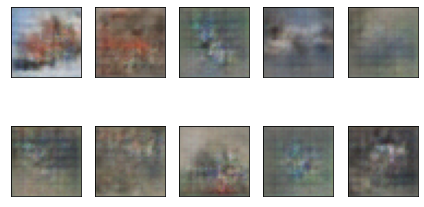

Time for epoch 291 is 25.44526767730713 sec
epoch = 292/400, d_loss=0.003, g_loss=6.951
Time for epoch 292 is 25.55042600631714 sec
epoch = 293/400, d_loss=0.005, g_loss=6.337
Time for epoch 293 is 25.337782859802246 sec
epoch = 294/400, d_loss=0.002, g_loss=12.399
Time for epoch 294 is 25.230785846710205 sec
epoch = 295/400, d_loss=0.003, g_loss=5.941
Time for epoch 295 is 25.02615785598755 sec
epoch = 296/400, d_loss=0.002, g_loss=8.860


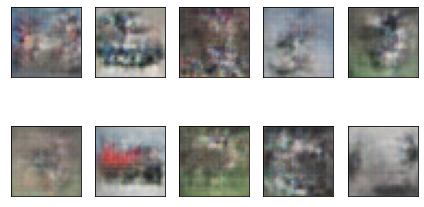

Time for epoch 296 is 26.220674514770508 sec
epoch = 297/400, d_loss=0.008, g_loss=7.583
Time for epoch 297 is 25.354814529418945 sec
epoch = 298/400, d_loss=0.058, g_loss=6.776
Time for epoch 298 is 25.577858209609985 sec
epoch = 299/400, d_loss=0.005, g_loss=8.505
Time for epoch 299 is 25.4868586063385 sec
epoch = 300/400, d_loss=0.009, g_loss=10.194
Time for epoch 300 is 25.52165174484253 sec
epoch = 301/400, d_loss=0.012, g_loss=3.059


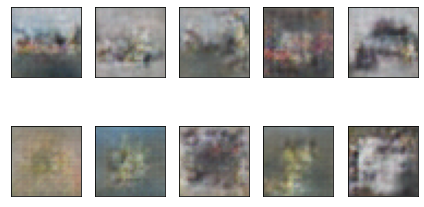

Time for epoch 301 is 25.777751684188843 sec
epoch = 302/400, d_loss=0.004, g_loss=4.948
Time for epoch 302 is 25.03640341758728 sec
epoch = 303/400, d_loss=0.002, g_loss=6.820
Time for epoch 303 is 25.212823152542114 sec
epoch = 304/400, d_loss=0.861, g_loss=10.743
Time for epoch 304 is 25.249358415603638 sec
epoch = 305/400, d_loss=0.004, g_loss=5.426
Time for epoch 305 is 25.196247339248657 sec
epoch = 306/400, d_loss=0.006, g_loss=3.743


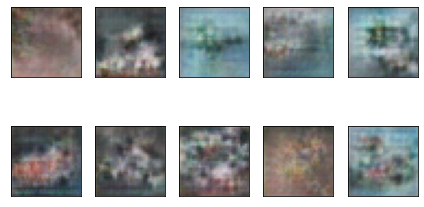

Time for epoch 306 is 25.980279445648193 sec
epoch = 307/400, d_loss=0.009, g_loss=5.998
Time for epoch 307 is 25.854235649108887 sec
epoch = 308/400, d_loss=0.001, g_loss=7.261
Time for epoch 308 is 25.774422645568848 sec
epoch = 309/400, d_loss=0.009, g_loss=5.313
Time for epoch 309 is 25.28842520713806 sec
epoch = 310/400, d_loss=0.010, g_loss=7.834
Time for epoch 310 is 25.11478590965271 sec
epoch = 311/400, d_loss=0.017, g_loss=7.408


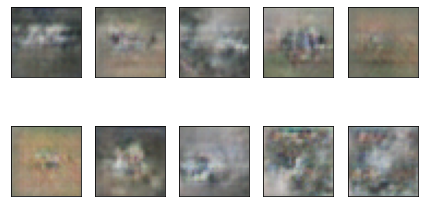

Time for epoch 311 is 25.387792825698853 sec
epoch = 312/400, d_loss=0.001, g_loss=6.771
Time for epoch 312 is 25.32347297668457 sec
epoch = 313/400, d_loss=0.001, g_loss=9.583
Time for epoch 313 is 25.51601529121399 sec
epoch = 314/400, d_loss=0.009, g_loss=5.476
Time for epoch 314 is 25.076581954956055 sec
epoch = 315/400, d_loss=0.007, g_loss=7.168
Time for epoch 315 is 25.553545475006104 sec
epoch = 316/400, d_loss=0.054, g_loss=6.788


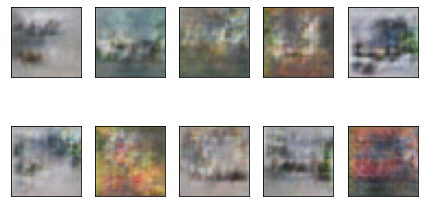

Time for epoch 316 is 26.16063952445984 sec
epoch = 317/400, d_loss=0.000, g_loss=8.956
Time for epoch 317 is 25.372297286987305 sec
epoch = 318/400, d_loss=0.047, g_loss=2.996
Time for epoch 318 is 25.46983313560486 sec
epoch = 319/400, d_loss=0.001, g_loss=10.535
Time for epoch 319 is 25.54705286026001 sec
epoch = 320/400, d_loss=0.006, g_loss=6.726
Time for epoch 320 is 25.75622272491455 sec
epoch = 321/400, d_loss=0.001, g_loss=6.196


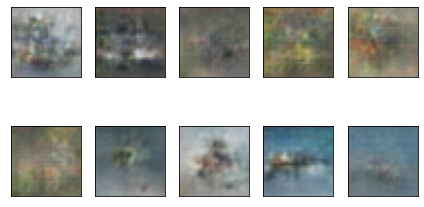

Time for epoch 321 is 26.81000518798828 sec
epoch = 322/400, d_loss=0.004, g_loss=8.602
Time for epoch 322 is 26.1965069770813 sec
epoch = 323/400, d_loss=0.001, g_loss=9.202
Time for epoch 323 is 25.191797971725464 sec
epoch = 324/400, d_loss=0.001, g_loss=8.661
Time for epoch 324 is 25.453999996185303 sec
epoch = 325/400, d_loss=0.001, g_loss=7.595
Time for epoch 325 is 25.90341854095459 sec
epoch = 326/400, d_loss=0.013, g_loss=4.210


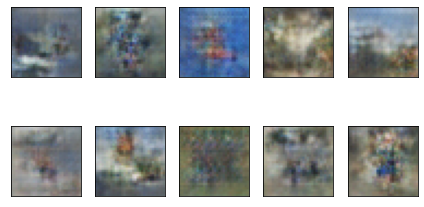

Time for epoch 326 is 25.90493679046631 sec
epoch = 327/400, d_loss=0.012, g_loss=7.046
Time for epoch 327 is 25.482002019882202 sec
epoch = 328/400, d_loss=0.002, g_loss=8.962
Time for epoch 328 is 25.084231853485107 sec
epoch = 329/400, d_loss=0.005, g_loss=6.554
Time for epoch 329 is 25.25964379310608 sec
epoch = 330/400, d_loss=0.001, g_loss=7.955
Time for epoch 330 is 25.495867490768433 sec
epoch = 331/400, d_loss=0.001, g_loss=8.255


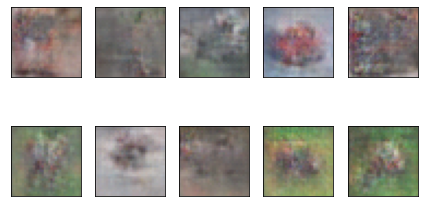

Time for epoch 331 is 25.694506883621216 sec
epoch = 332/400, d_loss=0.008, g_loss=7.925
Time for epoch 332 is 25.668601274490356 sec
epoch = 333/400, d_loss=0.001, g_loss=4.427
Time for epoch 333 is 25.431291580200195 sec
epoch = 334/400, d_loss=0.000, g_loss=7.504
Time for epoch 334 is 25.418565273284912 sec
epoch = 335/400, d_loss=0.005, g_loss=5.840
Time for epoch 335 is 25.118233680725098 sec
epoch = 336/400, d_loss=0.008, g_loss=4.414


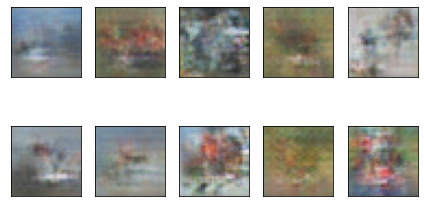

Time for epoch 336 is 26.056078672409058 sec
epoch = 337/400, d_loss=0.002, g_loss=10.719
Time for epoch 337 is 25.445276260375977 sec
epoch = 338/400, d_loss=0.026, g_loss=6.191
Time for epoch 338 is 25.395601987838745 sec
epoch = 339/400, d_loss=0.007, g_loss=4.953
Time for epoch 339 is 25.081855297088623 sec
epoch = 340/400, d_loss=0.003, g_loss=4.160
Time for epoch 340 is 25.538955211639404 sec
epoch = 341/400, d_loss=0.115, g_loss=7.085


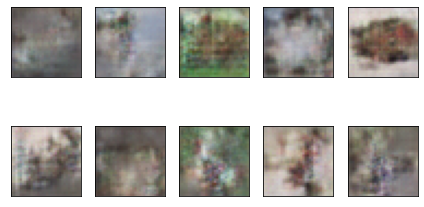

Time for epoch 341 is 25.886781930923462 sec
epoch = 342/400, d_loss=0.007, g_loss=7.771
Time for epoch 342 is 25.058135271072388 sec
epoch = 343/400, d_loss=0.061, g_loss=5.978
Time for epoch 343 is 25.464221477508545 sec
epoch = 344/400, d_loss=0.012, g_loss=6.537
Time for epoch 344 is 25.533410787582397 sec
epoch = 345/400, d_loss=0.004, g_loss=5.342
Time for epoch 345 is 25.619688510894775 sec
epoch = 346/400, d_loss=0.007, g_loss=6.988


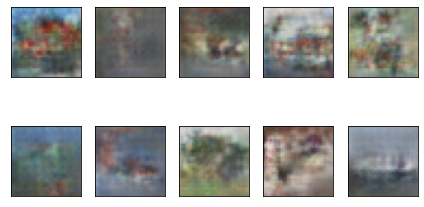

Time for epoch 346 is 25.170457124710083 sec
epoch = 347/400, d_loss=0.000, g_loss=8.160
Time for epoch 347 is 25.245660305023193 sec
epoch = 348/400, d_loss=0.006, g_loss=7.930
Time for epoch 348 is 25.621694564819336 sec
epoch = 349/400, d_loss=0.001, g_loss=8.872
Time for epoch 349 is 24.960723161697388 sec
epoch = 350/400, d_loss=0.094, g_loss=7.831
Time for epoch 350 is 25.312269926071167 sec
epoch = 351/400, d_loss=0.009, g_loss=7.564


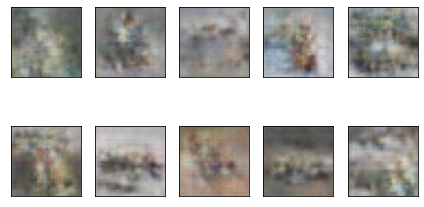

Time for epoch 351 is 25.390984296798706 sec
epoch = 352/400, d_loss=0.011, g_loss=7.483
Time for epoch 352 is 25.196807146072388 sec
epoch = 353/400, d_loss=0.270, g_loss=5.357
Time for epoch 353 is 25.408823013305664 sec
epoch = 354/400, d_loss=0.000, g_loss=12.664
Time for epoch 354 is 25.213993310928345 sec
epoch = 355/400, d_loss=0.008, g_loss=7.969
Time for epoch 355 is 25.090083122253418 sec
epoch = 356/400, d_loss=0.005, g_loss=4.692


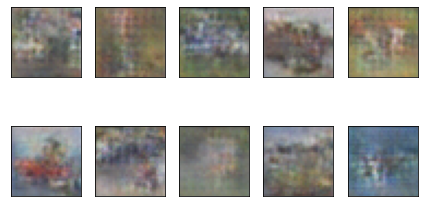

Time for epoch 356 is 25.340738534927368 sec
epoch = 357/400, d_loss=0.011, g_loss=7.483
Time for epoch 357 is 25.814611434936523 sec
epoch = 358/400, d_loss=0.025, g_loss=7.197
Time for epoch 358 is 25.74437379837036 sec
epoch = 359/400, d_loss=0.003, g_loss=9.521
Time for epoch 359 is 24.745933532714844 sec
epoch = 360/400, d_loss=0.030, g_loss=6.735
Time for epoch 360 is 25.634049654006958 sec
epoch = 361/400, d_loss=0.005, g_loss=6.492


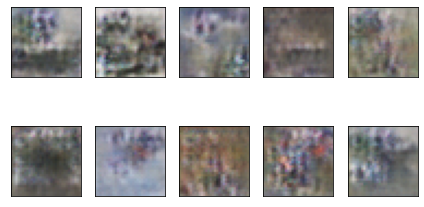

Time for epoch 361 is 25.49755024909973 sec
epoch = 362/400, d_loss=0.010, g_loss=9.321
Time for epoch 362 is 25.5766704082489 sec
epoch = 363/400, d_loss=0.001, g_loss=9.206
Time for epoch 363 is 25.369075059890747 sec
epoch = 364/400, d_loss=0.005, g_loss=3.968
Time for epoch 364 is 25.6068913936615 sec
epoch = 365/400, d_loss=0.037, g_loss=5.301
Time for epoch 365 is 25.367300748825073 sec
epoch = 366/400, d_loss=0.003, g_loss=7.548


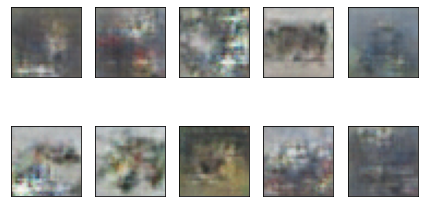

Time for epoch 366 is 25.547532558441162 sec
epoch = 367/400, d_loss=0.006, g_loss=6.697
Time for epoch 367 is 25.284696578979492 sec
epoch = 368/400, d_loss=0.002, g_loss=6.568
Time for epoch 368 is 25.79937195777893 sec
epoch = 369/400, d_loss=0.006, g_loss=8.709
Time for epoch 369 is 25.900838613510132 sec
epoch = 370/400, d_loss=0.014, g_loss=8.269
Time for epoch 370 is 24.91761302947998 sec
epoch = 371/400, d_loss=0.005, g_loss=5.954


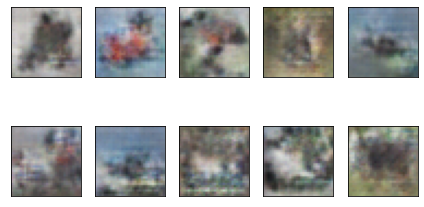

Time for epoch 371 is 25.940630674362183 sec
epoch = 372/400, d_loss=0.002, g_loss=8.094
Time for epoch 372 is 25.548758506774902 sec
epoch = 373/400, d_loss=0.000, g_loss=6.258
Time for epoch 373 is 25.935224294662476 sec
epoch = 374/400, d_loss=0.010, g_loss=9.841
Time for epoch 374 is 25.813718795776367 sec
epoch = 375/400, d_loss=0.005, g_loss=12.610
Time for epoch 375 is 25.454970359802246 sec
epoch = 376/400, d_loss=0.009, g_loss=6.644


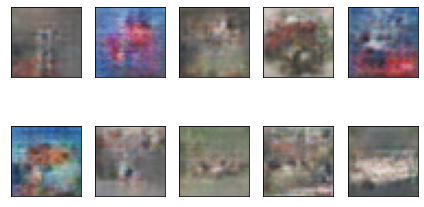

Time for epoch 376 is 26.53312039375305 sec
epoch = 377/400, d_loss=0.033, g_loss=8.308
Time for epoch 377 is 25.161293506622314 sec
epoch = 378/400, d_loss=0.000, g_loss=8.232
Time for epoch 378 is 24.85560393333435 sec
epoch = 379/400, d_loss=0.001, g_loss=9.039
Time for epoch 379 is 25.499266386032104 sec
epoch = 380/400, d_loss=0.013, g_loss=5.759
Time for epoch 380 is 25.238729238510132 sec
epoch = 381/400, d_loss=0.010, g_loss=7.685


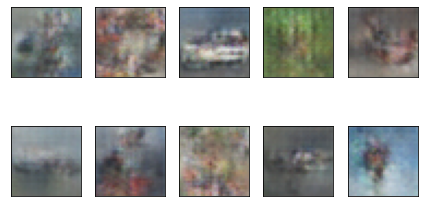

Time for epoch 381 is 25.830464124679565 sec
epoch = 382/400, d_loss=0.026, g_loss=5.346
Time for epoch 382 is 24.905346632003784 sec
epoch = 383/400, d_loss=0.003, g_loss=7.170
Time for epoch 383 is 25.11076807975769 sec
epoch = 384/400, d_loss=0.001, g_loss=4.688
Time for epoch 384 is 25.173850536346436 sec
epoch = 385/400, d_loss=0.034, g_loss=6.533
Time for epoch 385 is 25.33461833000183 sec
epoch = 386/400, d_loss=0.059, g_loss=5.785


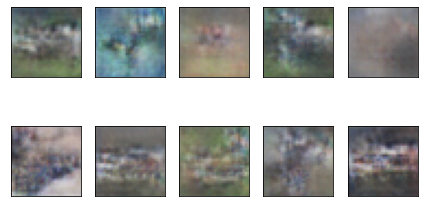

Time for epoch 386 is 25.736595392227173 sec
epoch = 387/400, d_loss=0.033, g_loss=4.812
Time for epoch 387 is 25.499088525772095 sec
epoch = 388/400, d_loss=0.059, g_loss=4.075
Time for epoch 388 is 25.710763454437256 sec
epoch = 389/400, d_loss=0.018, g_loss=5.089
Time for epoch 389 is 25.167882680892944 sec
epoch = 390/400, d_loss=0.012, g_loss=5.860
Time for epoch 390 is 25.64365816116333 sec
epoch = 391/400, d_loss=0.038, g_loss=10.123


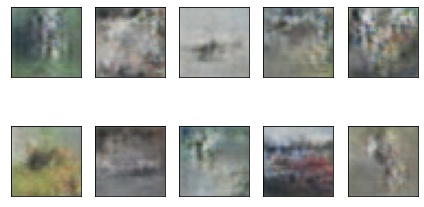

Time for epoch 391 is 25.9092378616333 sec
epoch = 392/400, d_loss=0.006, g_loss=9.412
Time for epoch 392 is 25.778602361679077 sec
epoch = 393/400, d_loss=0.001, g_loss=7.622
Time for epoch 393 is 25.523789644241333 sec
epoch = 394/400, d_loss=0.019, g_loss=5.015
Time for epoch 394 is 25.59393620491028 sec
epoch = 395/400, d_loss=0.004, g_loss=7.801
Time for epoch 395 is 25.818161010742188 sec
epoch = 396/400, d_loss=0.003, g_loss=3.589


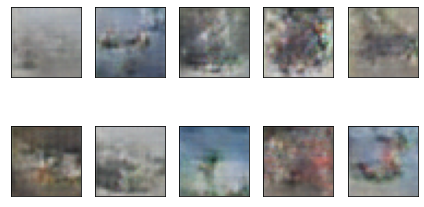

Time for epoch 396 is 26.221051454544067 sec
epoch = 397/400, d_loss=0.008, g_loss=7.559
Time for epoch 397 is 25.365556001663208 sec
epoch = 398/400, d_loss=0.082, g_loss=8.744
Time for epoch 398 is 25.625502824783325 sec
epoch = 399/400, d_loss=0.029, g_loss=7.580
Time for epoch 399 is 25.2423837184906 sec
epoch = 400/400, d_loss=0.002, g_loss=11.588
Time for epoch 400 is 25.632469654083252 sec
x_test2: 10000
Learning rate: 0.0045
Epoch 1/200


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:14: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  



Model saved in cifar.hdf5
Learning rate: 0.00405
Epoch 2/200



Model saved in cifar.hdf5
Learning rate: 0.003645
Epoch 3/200



Model saved in cifar.hdf5
Learning rate: 0.0032805
Epoch 4/200



Model saved in cifar.hdf5
Learning rate: 0.00295245
Epoch 5/200



Model saved in cifar.hdf5
Learning rate: 0.002657205
Epoch 6/200



Model saved in cifar.hdf5
Learning rate: 0.0023914846
Epoch 7/200



Model saved in cifar.hdf5
Learning rate: 0.002152336
Epoch 8/200



Model saved in cifar.hdf5
Learning rate: 0.0019371024
Epoch 9/200



Model saved in cifar.hdf5
Learning rate: 0.0017433922
Epoch 10/200



Model saved in cifar.hdf5
Learning rate: 0.0015690529
Epoch 11/200



Model saved in cifar.hdf5
Learning rate: 0.0014121477
Epoch 12/200



Model saved in cifar.hdf5
Learning rate: 0.001270933
Epoch 13/200



Model saved in cifar.hdf5
Learning rate: 0.0011438397
Epoch 14/200



Model saved in cifar.hdf5
Learning rate: 0.0010294557
Epoch 15/200



Model saved in cifar.hdf5
Learning rate: 0.0009265101
Epoch 16/200



Model saved in cifar.hdf5
Learning rate: 0.0008338591
Epoch 17/200



Model saved in cifar.hdf5
Learning rate: 0.0007504732
Epoch 18/200



Model saved in cifar.hdf5
Learning rate: 0.00067542586
Epoch 19/200



Model saved in cifar.hdf5
Learning rate: 0.00060788327
Epoch 20/200



Model saved in cifar.hdf5
Learning rate: 0.00054709497
Epoch 21/200



Model saved in cifar.hdf5
Learning rate: 0.0004923855
Epoch 22/200



Model saved in cifar.hdf5
Learning rate: 0.0004431469
Epoch 23/200



Model saved in cifar.hdf5
Learning rate: 0.00039883223
Epoch 24/200



Model saved in cifar.hdf5
Learning rate: 0.000358949
Epoch 25/200



Model saved in cifar.hdf5
Learning rate: 0.0003230541
Epoch 26/200



Model saved in cifar.hdf5
Learning rate: 0.0002907487
Epoch 27/200



Model saved in cifar.hdf5
Learning rate: 0.00026167382
Epoch 28/200



Model saved in cifar.hdf5
Learning rate: 0.00023550644
Epoch 29/200



Model saved in cifar.hdf5
Learning rate: 0.00021195579
Epoch 30/200



Model saved in cifar.hdf5
Learning rate: 0.00019076021
Epoch 31/200



Model saved in cifar.hdf5
Learning rate: 0.0001716842
Epoch 32/200



Model saved in cifar.hdf5
Learning rate: 0.00015451577
Epoch 33/200



Model saved in cifar.hdf5
Learning rate: 0.0001390642
Epoch 34/200



Model saved in cifar.hdf5
Learning rate: 0.00012515778
Epoch 35/200



Model saved in cifar.hdf5
Learning rate: 0.000112641996
Epoch 36/200



Model saved in cifar.hdf5
Learning rate: 0.000101377795
Epoch 37/200



Model saved in cifar.hdf5
Learning rate: 9.124002e-05
Epoch 38/200



Model saved in cifar.hdf5
Learning rate: 8.2116014e-05
Epoch 39/200



Model saved in cifar.hdf5
Learning rate: 7.390441e-05
Epoch 40/200



Model saved in cifar.hdf5
Learning rate: 6.6513974e-05
Epoch 41/200



Model saved in cifar.hdf5
Learning rate: 5.9862577e-05
Epoch 42/200



Model saved in cifar.hdf5
Learning rate: 5.387632e-05
Epoch 43/200



Model saved in cifar.hdf5
Learning rate: 4.8488688e-05
Epoch 44/200



Model saved in cifar.hdf5
Learning rate: 4.363982e-05
Epoch 45/200



Model saved in cifar.hdf5
Learning rate: 3.9275837e-05
Epoch 46/200



Model saved in cifar.hdf5
Learning rate: 3.5348254e-05
Epoch 47/200



Model saved in cifar.hdf5
Learning rate: 3.1813426e-05
Epoch 48/200



Model saved in cifar.hdf5
Learning rate: 2.8632085e-05
Epoch 49/200



Model saved in cifar.hdf5
Learning rate: 2.5768875e-05
Epoch 50/200



Model saved in cifar.hdf5
Learning rate: 2.3191988e-05
Epoch 51/200



Model saved in cifar.hdf5
Learning rate: 2.0872789e-05
Epoch 52/200



Model saved in cifar.hdf5
Learning rate: 1.8785511e-05
Epoch 53/200



Model saved in cifar.hdf5
Learning rate: 1.6906959e-05
Epoch 54/200



Model saved in cifar.hdf5
Learning rate: 1.5216264e-05
Epoch 55/200



Model saved in cifar.hdf5
Learning rate: 1.3694637e-05
Epoch 56/200



Model saved in cifar.hdf5
Learning rate: 1.2325174e-05
Epoch 57/200



Model saved in cifar.hdf5
Learning rate: 1.1092656e-05
Epoch 58/200



Model saved in cifar.hdf5
Learning rate: 9.983391e-06
Epoch 59/200



Model saved in cifar.hdf5
Learning rate: 8.985052e-06
Epoch 60/200



Model saved in cifar.hdf5
Learning rate: 8.086547e-06
Epoch 61/200



Model saved in cifar.hdf5
Learning rate: 7.2778917e-06
Epoch 62/200



Model saved in cifar.hdf5
Learning rate: 6.5501026e-06
Epoch 63/200



Model saved in cifar.hdf5
Learning rate: 5.8950923e-06
Epoch 64/200



Model saved in cifar.hdf5
Learning rate: 5.3055833e-06
Epoch 65/200



Model saved in cifar.hdf5
Learning rate: 4.7750245e-06
Epoch 66/200



Model saved in cifar.hdf5
Learning rate: 4.297522e-06
Epoch 67/200



Model saved in cifar.hdf5
Learning rate: 3.86777e-06
Epoch 68/200



Model saved in cifar.hdf5
Learning rate: 3.480993e-06
Epoch 69/200



Model saved in cifar.hdf5
Learning rate: 3.1328937e-06
Epoch 70/200



Model saved in cifar.hdf5
Learning rate: 2.8196043e-06
Epoch 71/200



Model saved in cifar.hdf5
Learning rate: 2.537644e-06
Epoch 72/200



Model saved in cifar.hdf5
Learning rate: 2.2838794e-06
Epoch 73/200



Model saved in cifar.hdf5
Learning rate: 2.0554917e-06
Epoch 74/200



Model saved in cifar.hdf5
Learning rate: 1.8499425e-06
Epoch 75/200



Model saved in cifar.hdf5
Learning rate: 1.6649482e-06
Epoch 76/200



Model saved in cifar.hdf5
Learning rate: 1.4984533e-06
Epoch 77/200



Model saved in cifar.hdf5
Learning rate: 1.3486081e-06
Epoch 78/200



Model saved in cifar.hdf5
Learning rate: 1.2137472e-06
Epoch 79/200



Model saved in cifar.hdf5
Learning rate: 1.0923725e-06
Epoch 80/200



Model saved in cifar.hdf5
Learning rate: 9.831352e-07
Epoch 81/200



Model saved in cifar.hdf5
Learning rate: 8.848217e-07
Epoch 82/200



Model saved in cifar.hdf5
Learning rate: 7.963396e-07
Epoch 83/200



Model saved in cifar.hdf5
Learning rate: 7.167056e-07
Epoch 84/200



Model saved in cifar.hdf5
Learning rate: 6.45035e-07
Epoch 85/200



Model saved in cifar.hdf5
Learning rate: 5.8053155e-07
Epoch 86/200



Model saved in cifar.hdf5
Learning rate: 5.224784e-07
Epoch 87/200



Model saved in cifar.hdf5
Learning rate: 4.7023053e-07
Epoch 88/200



Model saved in cifar.hdf5
Learning rate: 4.232075e-07
Epoch 89/200



Model saved in cifar.hdf5
Learning rate: 3.8088675e-07
Epoch 90/200



Model saved in cifar.hdf5
Learning rate: 3.4279807e-07
Epoch 91/200



Model saved in cifar.hdf5
Learning rate: 3.0851825e-07
Epoch 92/200



Model saved in cifar.hdf5
Learning rate: 2.7766643e-07
Epoch 93/200



Model saved in cifar.hdf5
Learning rate: 2.4989978e-07
Epoch 94/200



Model saved in cifar.hdf5
Learning rate: 2.2490981e-07
Epoch 95/200



Model saved in cifar.hdf5
Learning rate: 2.0241883e-07
Epoch 96/200



Model saved in cifar.hdf5
Learning rate: 1.8217695e-07
Epoch 97/200



Model saved in cifar.hdf5
Learning rate: 1.6395926e-07
Epoch 98/200



Model saved in cifar.hdf5
Learning rate: 1.4756333e-07
Epoch 99/200



Model saved in cifar.hdf5
Learning rate: 1.3280699e-07
Epoch 100/200



Model saved in cifar.hdf5
Learning rate: 1.1952629e-07
Epoch 101/200



Model saved in cifar.hdf5
Learning rate: 1.0757366e-07
Epoch 102/200



Model saved in cifar.hdf5
Learning rate: 9.68163e-08
Epoch 103/200



Model saved in cifar.hdf5
Learning rate: 8.7134666e-08
Epoch 104/200



Model saved in cifar.hdf5
Learning rate: 7.84212e-08
Epoch 105/200



Model saved in cifar.hdf5
Learning rate: 7.0579084e-08
Epoch 106/200



Model saved in cifar.hdf5
Learning rate: 6.352117e-08
Epoch 107/200



Model saved in cifar.hdf5
Learning rate: 5.7169057e-08
Epoch 108/200



Model saved in cifar.hdf5
Learning rate: 5.145215e-08
Epoch 109/200



Model saved in cifar.hdf5
Learning rate: 4.6306937e-08
Epoch 110/200



Model saved in cifar.hdf5
Learning rate: 4.167624e-08
Epoch 111/200



Model saved in cifar.hdf5
Learning rate: 3.7508617e-08
Epoch 112/200



Model saved in cifar.hdf5
Learning rate: 3.3757757e-08
Epoch 113/200



Model saved in cifar.hdf5
Learning rate: 3.038198e-08
Epoch 114/200



Model saved in cifar.hdf5
Learning rate: 2.7343782e-08
Epoch 115/200



Model saved in cifar.hdf5
Learning rate: 2.4609404e-08
Epoch 116/200



Model saved in cifar.hdf5
Learning rate: 2.2148464e-08
Epoch 117/200



Model saved in cifar.hdf5
Learning rate: 1.9933617e-08
Epoch 118/200



Model saved in cifar.hdf5
Learning rate: 1.7940256e-08
Epoch 119/200



Model saved in cifar.hdf5
Learning rate: 1.614623e-08
Epoch 120/200



Model saved in cifar.hdf5
Learning rate: 1.4531607e-08
Epoch 121/200



Model saved in cifar.hdf5
Learning rate: 1.3078447e-08
Epoch 122/200



Model saved in cifar.hdf5
Learning rate: 1.1770601e-08
Epoch 123/200



Model saved in cifar.hdf5
Learning rate: 1.0593541e-08
Epoch 124/200



Model saved in cifar.hdf5
Learning rate: 9.534188e-09
Epoch 125/200



Model saved in cifar.hdf5
Learning rate: 8.580769e-09
Epoch 126/200



Model saved in cifar.hdf5
Learning rate: 7.722692e-09
Epoch 127/200



Model saved in cifar.hdf5
Learning rate: 6.9504225e-09
Epoch 128/200



Model saved in cifar.hdf5
Learning rate: 6.25538e-09
Epoch 129/200



Model saved in cifar.hdf5
Learning rate: 5.6298424e-09
Epoch 130/200



Model saved in cifar.hdf5
Learning rate: 5.066858e-09
Epoch 131/200



Model saved in cifar.hdf5
Learning rate: 4.5601722e-09
Epoch 132/200



Model saved in cifar.hdf5
Learning rate: 4.1041552e-09
Epoch 133/200



Model saved in cifar.hdf5
Learning rate: 3.6937395e-09
Epoch 134/200



Model saved in cifar.hdf5
Learning rate: 3.3243657e-09
Epoch 135/200



Model saved in cifar.hdf5
Learning rate: 2.991929e-09
Epoch 136/200



Model saved in cifar.hdf5
Learning rate: 2.692736e-09
Epoch 137/200



Model saved in cifar.hdf5
Learning rate: 2.4234625e-09
Epoch 138/200



Model saved in cifar.hdf5
Learning rate: 2.1811162e-09
Epoch 139/200



Model saved in cifar.hdf5
Learning rate: 1.9630046e-09
Epoch 140/200



Model saved in cifar.hdf5
Learning rate: 1.7667042e-09
Epoch 141/200



Model saved in cifar.hdf5
Learning rate: 1.5900338e-09
Epoch 142/200



Model saved in cifar.hdf5
Learning rate: 1.4310304e-09
Epoch 143/200



Model saved in cifar.hdf5
Learning rate: 1.2879273e-09
Epoch 144/200



Model saved in cifar.hdf5
Learning rate: 1.1591346e-09
Epoch 145/200



Model saved in cifar.hdf5
Learning rate: 1.0432212e-09
Epoch 146/200



Model saved in cifar.hdf5
Learning rate: 9.388991e-10
Epoch 147/200



Model saved in cifar.hdf5
Learning rate: 8.450091e-10
Epoch 148/200



Model saved in cifar.hdf5
Learning rate: 7.605082e-10
Epoch 149/200



Model saved in cifar.hdf5
Learning rate: 6.844574e-10
Epoch 150/200



Model saved in cifar.hdf5
Learning rate: 6.1601163e-10
Epoch 151/200



Model saved in cifar.hdf5
Learning rate: 5.544105e-10
Epoch 152/200



Model saved in cifar.hdf5
Learning rate: 4.989694e-10
Epoch 153/200



Model saved in cifar.hdf5
Learning rate: 4.490725e-10
Epoch 154/200



Model saved in cifar.hdf5
Learning rate: 4.0416526e-10
Epoch 155/200



Model saved in cifar.hdf5
Learning rate: 3.6374873e-10
Epoch 156/200



Model saved in cifar.hdf5
Learning rate: 3.2737385e-10
Epoch 157/200



Model saved in cifar.hdf5
Learning rate: 2.9463645e-10
Epoch 158/200



Model saved in cifar.hdf5
Learning rate: 2.6517283e-10
Epoch 159/200



Model saved in cifar.hdf5
Learning rate: 2.3865554e-10
Epoch 160/200



Model saved in cifar.hdf5
Learning rate: 2.1478998e-10
Epoch 161/200



Model saved in cifar.hdf5
Learning rate: 1.9331098e-10
Epoch 162/200



Model saved in cifar.hdf5
Learning rate: 1.7397989e-10
Epoch 163/200



Model saved in cifar.hdf5
Learning rate: 1.565819e-10
Epoch 164/200



Model saved in cifar.hdf5
Learning rate: 1.409237e-10
Epoch 165/200



Model saved in cifar.hdf5
Learning rate: 1.2683134e-10
Epoch 166/200



Model saved in cifar.hdf5
Learning rate: 1.14148205e-10
Epoch 167/200



Model saved in cifar.hdf5
Learning rate: 1.02733384e-10
Epoch 168/200



Model saved in cifar.hdf5
Learning rate: 9.246005e-11
Epoch 169/200



Model saved in cifar.hdf5
Learning rate: 8.321404e-11
Epoch 170/200



Model saved in cifar.hdf5
Learning rate: 7.4892634e-11
Epoch 171/200



Model saved in cifar.hdf5
Learning rate: 6.7403375e-11
Epoch 172/200



Model saved in cifar.hdf5
Learning rate: 6.066304e-11
Epoch 173/200



Model saved in cifar.hdf5
Learning rate: 5.4596733e-11
Epoch 174/200



Model saved in cifar.hdf5
Learning rate: 4.913706e-11
Epoch 175/200



Model saved in cifar.hdf5
Learning rate: 4.4223354e-11
Epoch 176/200



Model saved in cifar.hdf5
Learning rate: 3.9801017e-11
Epoch 177/200



Model saved in cifar.hdf5
Learning rate: 3.5820916e-11
Epoch 178/200



Model saved in cifar.hdf5
Learning rate: 3.2238823e-11
Epoch 179/200



Model saved in cifar.hdf5
Learning rate: 2.9014941e-11
Epoch 180/200



Model saved in cifar.hdf5
Learning rate: 2.6113448e-11
Epoch 181/200



Model saved in cifar.hdf5
Learning rate: 2.3502103e-11
Epoch 182/200



Model saved in cifar.hdf5
Learning rate: 2.1151893e-11
Epoch 183/200



Model saved in cifar.hdf5
Learning rate: 1.9036703e-11
Epoch 184/200



Model saved in cifar.hdf5
Learning rate: 1.7133033e-11
Epoch 185/200



Model saved in cifar.hdf5
Learning rate: 1.541973e-11
Epoch 186/200



Model saved in cifar.hdf5
Learning rate: 1.3877757e-11
Epoch 187/200



Model saved in cifar.hdf5
Learning rate: 1.2489981e-11
Epoch 188/200



Model saved in cifar.hdf5
Learning rate: 1.1240983e-11
Epoch 189/200



Model saved in cifar.hdf5
Learning rate: 1.0116885e-11
Epoch 190/200



Model saved in cifar.hdf5
Learning rate: 9.105196e-12
Epoch 191/200



Model saved in cifar.hdf5
Learning rate: 8.194677e-12
Epoch 192/200



Model saved in cifar.hdf5
Learning rate: 7.375209e-12
Epoch 193/200



Model saved in cifar.hdf5
Learning rate: 6.637688e-12
Epoch 194/200



Model saved in cifar.hdf5
Learning rate: 5.9739193e-12
Epoch 195/200



Model saved in cifar.hdf5
Learning rate: 5.3765273e-12
Epoch 196/200



Model saved in cifar.hdf5
Learning rate: 4.8388745e-12
Epoch 197/200



Model saved in cifar.hdf5
Learning rate: 4.3549873e-12
Epoch 198/200



Model saved in cifar.hdf5
Learning rate: 3.9194884e-12
Epoch 199/200



Model saved in cifar.hdf5
Learning rate: 3.5275396e-12
Epoch 200/200



Model saved in cifar.hdf5
c test accuracy: 0.8159
c' test accuracy: 0.1238


In [ ]:
# Step 1: Train a classifier C for CIFAR10 from scratch using (x_train, y_train)
# Step 2: Use x_train to train a GAN with latent dimension = 100 for 200 epochs
# Step 3: Generate 50,000 fake image samples
# Step 4: Use C to produce labels for all fake images
# Step 5: Train a classifier C' from scratch using the fake images and the predicted labels
# Step 6: Compare C and C' on (x_test, y_test)

#CIFAR10 data set contains 50k 32x32 images in the training set, and 10k images in the test set
num_imgs = 50000

# plot random generated fake images 
fig = plt.figure(figsize=(8,3))
for i in range(0, 10):
    plt.subplot(2, 5, 1 + i, xticks=[], yticks=[])
    plt.imshow(x_train[i])
plt.tight_layout()

# # reshape the training input and cast as float32
# print(f"x_train shape: {x_train.shape}, type: {type(x_train)}")

# normalize the training input
x_train = (np.float32(x_train)/255) - 0.5
x_train = tf.data.Dataset.from_tensor_slices(x_train).shuffle(num_imgs).batch(batch_size, drop_remainder=True)

# # get number of batches
# num_batch = num_imgs // batch_size

# define all the models
generator = define_generator()
discriminator = define_discriminator()
gan = define_gan(generator,discriminator)

#train the models
train(g_model=generator, d_model=discriminator, gan_model=gan, dataset=x_train, n_batch=batch_size)
    

# Step 3: Generate 50,000 fake image samples
latent_dim = 100
num_imgs = 50000

# randomly generate 50000 training data set
random_noise = np.random.normal(size=(num_imgs,latent_dim))
random_img = generator.predict_on_batch(random_noise)
x_fake_train = random_img

# randomly generate 10000 testing data set
# random_noise2 = np.random.normal(size=(10000,latent_dim))
# random_img2 = generator.predict_on_batch(random_noise2)

# inspect preditions
# cifar10_classes = ["airplane", "automobile", "bird", "cat", "deer", 
#                    "dog", "frog", "horse", "ship", "truck"]


# Step 4: Use c to produce labels for all fake images
# make test prediction
y_pred_test = model.predict_proba(x_fake_train)
y_pred_test_labels = np.argmax(y_pred_test, axis=1)
y_pred_test_max_probas = np.max(y_pred_test, axis=1)


# cols = 8
# rows = 2
# fig = plt.figure(figsize=(2 * cols - 1, 3 * rows - 1))
# for i in range(cols):
#     for j in range(rows):
#         random_index = np.random.randint(0, 50000)
#         ax = fig.add_subplot(rows, cols, i * rows + j + 1)
#         ax.grid(b=False)
#         ax.axis(b=False)
#         ax.imshow(x_fake_train[random_index, :])
#         pred_label = cifar10_classes[y_pred_test_labels[random_index]]
#         pred_proba = y_pred_test_max_probas[random_index]
#         ax.set_title("pred: {}\nscore: {:.3}".format(
#               pred_label, pred_proba
#        ))
# plt.show()

# Step 5: Train a classifier c' from scratch using the fake images and the predicted labels
pred_label = y_pred_test_labels[:]
y_fake_train = pred_label
y_fake_train = np.reshape(y_fake_train,(50000,1))
x_fake_train  = [((x/255) - 0.5) for x in x_fake_train]
x_fake_train = np.array(x_fake_train)

# convert class labels to one-hot encoded, should have shape (?, NUM_CLASSES)
y_train2 = keras.utils.to_categorical(y_fake_train)

INIT_LR = 5e-3  # initial learning rate
BATCH_SIZE = 32
EPOCHS = 200

model1 = make_model()  # define our model
# model1.summary()

# prepare model for fitting (loss, optimizer, etc)
model1.compile(
    loss='categorical_crossentropy',  # we train 10-way classification
    optimizer=keras.optimizers.adamax(lr=INIT_LR),  # for SGD
    metrics=['accuracy']  # report accuracy during training
)

# scheduler of learning rate (decay with epochs)
def lr_scheduler(epoch):
    return INIT_LR * 0.85 ** epoch

# callback for printing of actual learning rate used by optimizer
class LrHistory(keras.callbacks.Callback):
    def on_epoch_begin(self, epoch, logs={}):
        print("Learning rate:", K.get_value(model1.optimizer.lr))


# we will save model checkpoints to continue training in case of kernel death
model1_filename = 'fake_cifar.{0:03d}.hdf5'
last_finished_epoch = None
print(f"x_test2: {len(x_test2)}")

# fit model
model1.fit(
    x_fake_train, y_train2,  # prepared data
    batch_size=BATCH_SIZE,
    epochs=EPOCHS,
    callbacks=[keras.callbacks.LearningRateScheduler(lr_scheduler), 
               LrHistory(), 
               TqdmProgressCallback(),
               ModelSaveCallback(model_filename)],
    #validation_data=(x_test2, y_test2),
    shuffle=True,
    verbose=0,
    initial_epoch=last_finished_epoch or 0
)

# save weights to file
model1.save_weights("fake_weights.h5")

# x_test for the original classifier c'
y__fake_pred_test = model1.predict_proba(x_test2)
y__fake_pred_test_classes = np.argmax(y__fake_pred_test, axis=1)
y__fake_pred_test_max_probas = np.max(y__fake_pred_test, axis=1)

# Step 6: Compare c and c' on (x_test, y_test)
print("c test accuracy:", accuracy_score(y_test[:], y_pred_test_classes))
print("c' test accuracy:", accuracy_score(y_test[:], y__fake_pred_test_classes))



## **Part 5: Visualize Class Activiation Map**

Using the code described in 

https://github.com/fchollet/deep-learning-with-python-notebooks/blob/master/5.4-visualizing-what-convnets-learn.ipynb 

Implement the class activation map (CAM) to show the parts of the test images above that led your CNN to its final classification decision

In [ ]:
from keras.models import load_model

model = load_model('cifar.hdf5')
model.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_13 (Conv2D)           (None, 32, 32, 16)        448       
_________________________________________________________________
leaky_re_lu_21 (LeakyReLU)   (None, 32, 32, 16)        0         
_________________________________________________________________
conv2d_14 (Conv2D)           (None, 32, 32, 32)        4640      
_________________________________________________________________
leaky_re_lu_22 (LeakyReLU)   (None, 32, 32, 32)        0         
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 16, 16, 32)        0         
_________________________________________________________________
dropout_10 (Dropout)         (None, 16, 16, 32)        0         
_________________________________________________________________
conv2d_15 (Conv2D)           (None, 16, 16, 32)       

Shape of the image: (32, 32, 3)


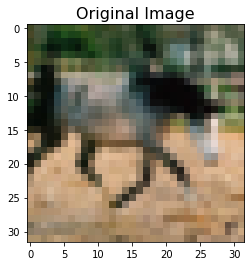

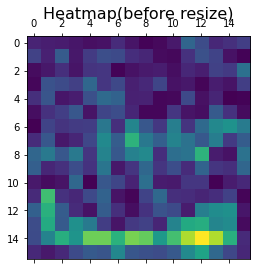

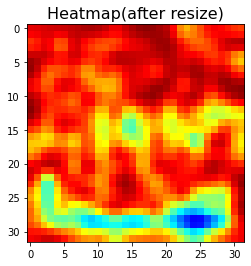

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


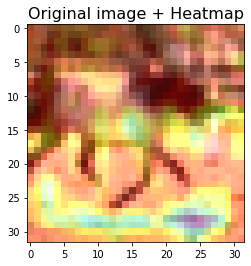

In [ ]:
from keras.datasets import cifar10
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

# Show a horse image x_train[52].
plt.imshow(x_train[52])
plt.title('Original Image', fontsize=16)

# Import the libraries
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input, decode_predictions
import numpy as np
import cv2

# Pick a horse image x_train[52] to show the heatmap.
img = x_train[52]
print('Shape of the image:', np.shape(img))

# 'x' is a numpy array of shape (32, 32, 3)
x = image.img_to_array(img)

# A dimension was added to increse the "batch", the dimension of the array is now (1, 32, 32, 3)
x = np.expand_dims(x, axis=0)

# This is the "horse" entry in the prediction vector, 7 is the class of horse
horse = model.output[:, 7]

# This is the output feature map of the 'conv2d_16' layer,
# the last convolutional layer in our architecture
last_conv_layer = model.get_layer('conv2d_16')

# This is the gradient of the "horse" class with regard to
# the output feature map of 'conv2d_16'
grads = K.gradients(horse, last_conv_layer.output)[0]


# This is a vector of shape (64,), where each entry
# is the mean intensity of the gradient over a specific feature map channel
pooled_grads = K.mean(grads, axis=(0, 1, 2))

# This function allows us to access the values of the quantities we just defined:
# 'pooled_grads' and the output feature map of 'conv2d_16', given a sample image.
iterate = K.function([model.input], [pooled_grads, last_conv_layer.output[0]])

# These are the values of these two quantities, as Numpy arrays,
# given our sample image of one horse
pooled_grads_value, conv_layer_output_value = iterate([x])

# We multiply each channel in the feature map array by "how important this channel is" with regard to the horse class
for i in range(10):
    conv_layer_output_value[:, :, i] *= pooled_grads_value[i]

# The channel-wise mean of the resulting feature map is our heatmap of class activation
heatmap = np.mean(conv_layer_output_value, axis= -1)

heatmap = np.abs(heatmap)
heatmap = np.maximum(heatmap, 0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.title('Heatmap(before resize)', fontsize=16)
plt.show()


# We resize the heatmap to have the same size as the original image
heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

# Convert the heatmap to RGB
heatmap = np.uint8(255 * heatmap)

# We apply the heatmap to the original image
heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

# 0.4 here is a heatmap intensity factor
#print(np.shape(heatmap),'after resize')
plt.imshow(heatmap)
plt.title('Heatmap(after resize)', fontsize=16)
plt.show()
superimposed_img = heatmap * 0.4 + img

superimposed_img = superimposed_img.astype(int)

# Save the image to disk
plt.imshow(superimposed_img)
plt.title('Original image + Heatmap', fontsize=16)
plt.show()
